## Importing libraries

In [1]:
from sqlalchemy import create_engine
import pymysql
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from Dora import Dora
import scipy 

from sqlalchemy import create_engine
import pymysql
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from Dora import Dora
import scipy 
from math import sqrt

#estimators
from sklearn.model_selection import train_test_split
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn import linear_model
from sklearn.svm import SVR
import sklearn as sklearn

#model metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import cross_val_score
from imblearn.over_sampling import SMOTE
from collections import Counter
from sklearn.datasets import make_classification
from sklearn import metrics
from sklearn.model_selection import train_test_split

### Reading training data as df

In [2]:
df = pd.read_csv('/Users/arnauandrews/Desktop/UBIQUM/5. Wifi Locationing/trainingData.csv', sep=',')

### Reading validation data as df_

In [3]:
df_= pd.read_csv('/Users/arnauandrews/Desktop/UBIQUM/5. Wifi Locationing/validationData.csv', sep=',')

In [4]:
df

,WAP001,WAP002,WAP003,WAP004,WAP005,WAP006,WAP007,WAP008,WAP009,WAP010,...,WAP520,LONGITUDE,LATITUDE,FLOOR,BUILDINGID,SPACEID,RELATIVEPOSITION,USERID,PHONEID,TIMESTAMP
0,100,100,100,100,100,100,100,100,100,100,...,100,-7541.2643,4.864921e+06,2,1,106,2,2,23,1371713733
1,100,100,100,100,100,100,100,100,100,100,...,100,-7536.6212,4.864934e+06,2,1,106,2,2,23,1371713691
2,100,100,100,100,100,100,100,-97,100,100,...,100,-7519.1524,4.864950e+06,2,1,103,2,2,23,1371714095
3,100,100,100,100,100,100,100,100,100,100,...,100,-7524.5704,4.864934e+06,2,1,102,2,2,23,1371713807
4,100,100,100,100,100,100,100,100,100,100,...,100,-7632.1436,4.864982e+06,0,0,122,2,11,13,1369909710
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19932,100,100,100,100,100,100,100,100,100,100,...,100,-7485.4686,4.864875e+06,3,1,1,2,18,10,1371710683
19933,100,100,100,100,100,100,100,100,100,100,...,100,-7390.6206,4.864836e+06,1,2,140,2,18,10,1371710402
19934,100,100,100,100,100,100,100,100,100,100,...,100,-7516.8415,4.864889e+06,3,1,13,2,18,10,1371710921
19935,100,100,100,100,100,100,100,100,100,100,...,100,-7537.3219,4.864896e+06,3,1,113,2,18,10,1371711049


In [5]:
df.describe()

,WAP001,WAP002,WAP003,WAP004,WAP005,WAP006,WAP007,WAP008,WAP009,WAP010,...,WAP520,LONGITUDE,LATITUDE,FLOOR,BUILDINGID,SPACEID,RELATIVEPOSITION,USERID,PHONEID,TIMESTAMP
count,19937.000000,19937.000000,19937.0,19937.0,19937.000000,19937.000000,19937.000000,19937.000000,19937.000000,19937.000000,...,19937.0,19937.000000,1.993700e+04,19937.000000,19937.000000,19937.000000,19937.000000,19937.000000,19937.000000,1.993700e+04
mean,99.823644,99.820936,100.0,100.0,99.613733,97.130461,94.733661,93.820234,94.693936,99.163766,...,100.0,-7464.275947,4.864871e+06,1.674575,1.212820,148.429954,1.833024,9.068014,13.021869,1.371421e+09
std,5.866842,5.798156,0.0,0.0,8.615657,22.931890,30.541335,33.010404,30.305084,12.634045,...,0.0,123.402010,6.693318e+01,1.223078,0.833139,58.342106,0.372964,4.988720,5.362410,5.572054e+05
min,-97.000000,-90.000000,100.0,100.0,-97.000000,-98.000000,-99.000000,-98.000000,-98.000000,-99.000000,...,100.0,-7691.338400,4.864746e+06,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.369909e+09
25%,100.000000,100.000000,100.0,100.0,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,...,100.0,-7594.737000,4.864821e+06,1.000000,0.000000,110.000000,2.000000,5.000000,8.000000,1.371056e+09
50%,100.000000,100.000000,100.0,100.0,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,...,100.0,-7423.060900,4.864852e+06,2.000000,1.000000,129.000000,2.000000,11.000000,13.000000,1.371716e+09
75%,100.000000,100.000000,100.0,100.0,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,...,100.0,-7359.193000,4.864930e+06,3.000000,2.000000,207.000000,2.000000,13.000000,14.000000,1.371721e+09
max,100.000000,100.000000,100.0,100.0,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,...,100.0,-7300.818990,4.865017e+06,4.000000,2.000000,254.000000,2.000000,18.000000,24.000000,1.371738e+09


In [6]:
df.info(['LONGITUDE'])

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19937 entries, 0 to 19936
Data columns (total 529 columns):
 #    Column            Dtype  
---   ------            -----  
 0    WAP001            int64  
 1    WAP002            int64  
 2    WAP003            int64  
 3    WAP004            int64  
 4    WAP005            int64  
 5    WAP006            int64  
 6    WAP007            int64  
 7    WAP008            int64  
 8    WAP009            int64  
 9    WAP010            int64  
 10   WAP011            int64  
 11   WAP012            int64  
 12   WAP013            int64  
 13   WAP014            int64  
 14   WAP015            int64  
 15   WAP016            int64  
 16   WAP017            int64  
 17   WAP018            int64  
 18   WAP019            int64  
 19   WAP020            int64  
 20   WAP021            int64  
 21   WAP022            int64  
 22   WAP023            int64  
 23   WAP024            int64  
 24   WAP025            int64  
 25   WAP026            in

In [7]:
df_

,WAP001,WAP002,WAP003,WAP004,WAP005,WAP006,WAP007,WAP008,WAP009,WAP010,...,WAP520,LONGITUDE,LATITUDE,FLOOR,BUILDINGID,SPACEID,RELATIVEPOSITION,USERID,PHONEID,TIMESTAMP
0,100,100,100,100,100,100,100,100,100,100,...,100,-7515.916799,4.864890e+06,1,1,0,0,0,0,1380872703
1,100,100,100,100,100,100,100,100,100,100,...,100,-7383.867221,4.864840e+06,4,2,0,0,0,13,1381155054
2,100,100,100,100,100,100,100,100,100,100,...,100,-7374.302080,4.864847e+06,4,2,0,0,0,13,1381155095
3,100,100,100,100,100,100,100,100,100,100,...,100,-7365.824883,4.864843e+06,4,2,0,0,0,13,1381155138
4,100,100,100,100,100,100,100,100,100,100,...,100,-7641.499303,4.864922e+06,2,0,0,0,0,2,1380877774
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1106,100,100,100,100,100,100,100,100,100,100,...,100,-7317.344231,4.864796e+06,3,2,0,0,0,13,1381156711
1107,100,100,100,100,100,100,100,100,100,100,...,100,-7313.731120,4.864792e+06,3,2,0,0,0,13,1381156730
1108,100,100,100,100,100,100,100,100,100,100,...,100,-7637.535798,4.864903e+06,0,0,0,0,0,13,1381247781
1109,100,100,100,100,100,100,100,100,100,100,...,100,-7636.654005,4.864905e+06,0,0,0,0,0,13,1381247807


## Exploratory Data Analysis (EDA)

### Goal of the data analysis:

Evaluate multiple machine learning models to see which produces the best result, enabling us to make a recommendation to the client. If your recommended model is sufficiently accurate, it will be incorporated into a smartphone app for indoor locationing.


This public dataset can be used to test the
accuracy of any localization algorithm based on RSSI levels or
for performing a comparison of localization algorithms under
the same experimental framework.

**Testing localization algorithms is the first use that external researchers
can do with the published dataset**


### Abstract: 

**Abstract** —Although **indoor localization** is a key topic for
mobile computing, it is still very difficult for the mobile sensing
community to compare state-of-art localization algorithms due to
the scarcity of databases. 

Thus, a multi-building and multi-floor
localization database based on WLAN fingerprinting is presented
in this work, being its public access granted for the research
community. 

The here proposed database not only is the biggest
database in the literature but it is also the first publicly available
database. Among other comprehensively described features, full
raw information taken by more than 20 users and by means of
25 devices is provided.

### Purpose of the research: 

In general, each indoor localization work used their own
data to publish the results, and therefore it is quite difficult to
make comparison among the proposed methods. A common
database is needed to perform this task. As it has been
commented before, in the Pattern Recognition and Machine
Learning research fields, it is a common practice to share
databases to allow other researchers to provide comparable
results when using their proposals. Up to date, WLAN-based
indoor localization methods have relatively small databases
which in some cases, come just from one building being often
captured using a small number of devices or by a small number
of users. The database presented in this paper overcomes all
these lacks.

### Advantages: 

· **Easy to deploy because of existing technology** One of the major advantages of the WLAN fingerprintbased methods is that they do not require the installation of
any additional hardware since they use the existing WLAN
infrastructure. Therefore, the location of the user can be
obtained without additional infrastructures and costs. However,
WLANs were not natively designed to support a positioning
function. 

· **No need to implemen new hardware to measure the indoor locationing of the building** However, infrastructure-less approaches use the already available wireless signals to profile a location, taking advantage
of the powerful mobile phones sensors. Our work is an
infrastructure-less approach since we use the already available
WLAN access points (WAPs) to construct the database by
using mobile phones.


### Challenges: 

· **Existing physical obstacles which weaken the signal (walls, floors)**. 
Taking into account the existing obstacles introduced
by the indoor environment (including reflections and multi path
interference) the spread of radio signal in indoor environments
is very hard to predict

· **Motion from the user affects RSSI Values**. In addition, in WLAN-based positioning systems, the user typically carries the mobile device
with him/her, being his/her motion or how the device is carried
an important factor that affects the measured RSSI values

· **Lack of common database for comparison purposes** Although there are many papers in the literature trying
to solve the indoor localization problem using a WLAN
fingerprint-based method, there still exists one important drawback in this field which is the lack of a common database
for comparison purposes. Each approach presents its estimated
results using its own database and describes how the experiment was carried out.

The main contribution of this work is the creation and the
presentation of the UJIIndoorLoc database which is the biggest
database in the literature as it was previously mentioned. It
would also be the first publicly available database that could
be used to make comparisons among different methods in this
field. The main characteristics of the database3
are:

• It covers a **surface of 108703m2
including 3 buildings with 4 or 5 floors depending on the building**.

• The number of different places (**reference points**) appearing in the database is 933.

• **21049 sampled points have been captured**: **19938 for training/learning** and **1111 for validation/testing**.

• **Dataset independence** has been assured by taking Validation (or testing) samples 4 months after Training ones.

• The number of different wireless access points **(WAPs)** appearing in the database is **520^^.

• Data were collected by **more than 20 users** using 25 different models of mobile devices (some users used more than one model).


### Description of each of the variables: 

· **001-520 RSSI levels**: 

1) RSSI Levels: The most important information for
WLAN fingerprinting comparison purposes are the WAPs
detected and their RSSI level values. In the proposed database,
this information represents the 98% of the data given in each
record (520 vector positions out of 529) as a 520-element
vector of integer values. These values represent the RSSI levels
whereas the WAP identifiers (MAC addresses) are linked to the
vector positions.


The database includes 520 WAPs identified by the MAC
address. These addresses have been alphabetically sorted and
sequentially renamed to WAPnnnn. We use these new identifiers instead of the MAC addresses due to privacy reasons.

The database contains information about 520 different WAPs, which are identified by their MAC addresses. The RSSI levels are measured in decibels (dBm) and range from -100 dBm (very weak signal) to 0 dBm (extremely good signal).

The WAPs and their corresponding RSSI levels are important for WLAN fingerprinting comparison purposes. WLAN fingerprinting is a technique used to identify a device's location based on its observed wireless signal strengths. By comparing the RSSI levels of detected WAPs at different locations, a device's location can be estimated. The database described in this text can be used as a reference to develop and test WLAN fingerprinting algorithms.


**Distribution of RSSI levels**: Although
these levels range from −104dBm to 0dBm, the number
of individual measures inside range [−45dBm...0dBm] is
insignificant and cover only 1.7% of total RSSI levels recorded
in our database. Similarly, the number of single measures
reporting a value lower than −95dBm is also insignificant
(2.3% of total RSSI measures

**Important Point**: The average
number of WAPs scanned in each capture is 17.92, therefore,
approximately 500 elements of the previously described vector
contain out of range values (represented as +100dBm)

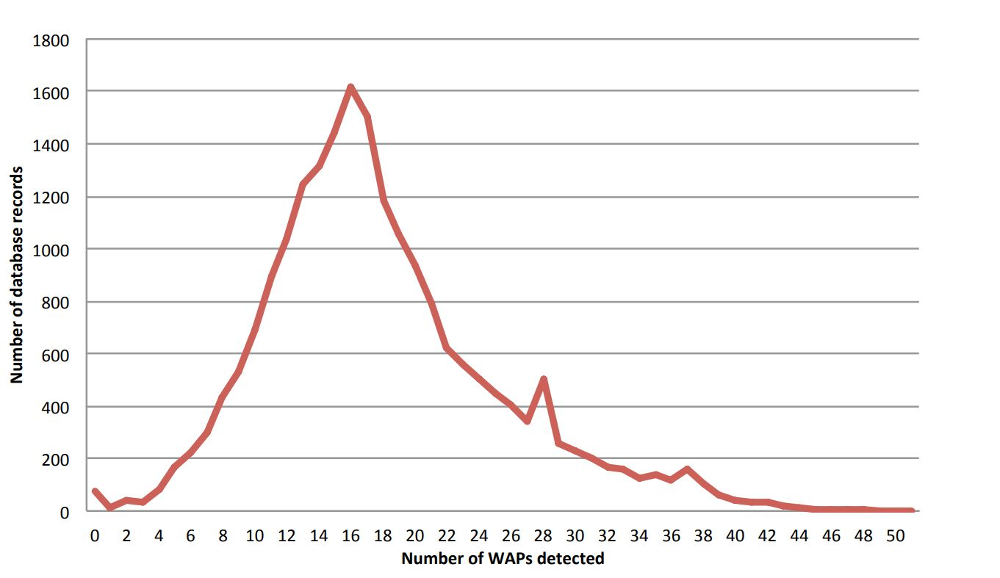

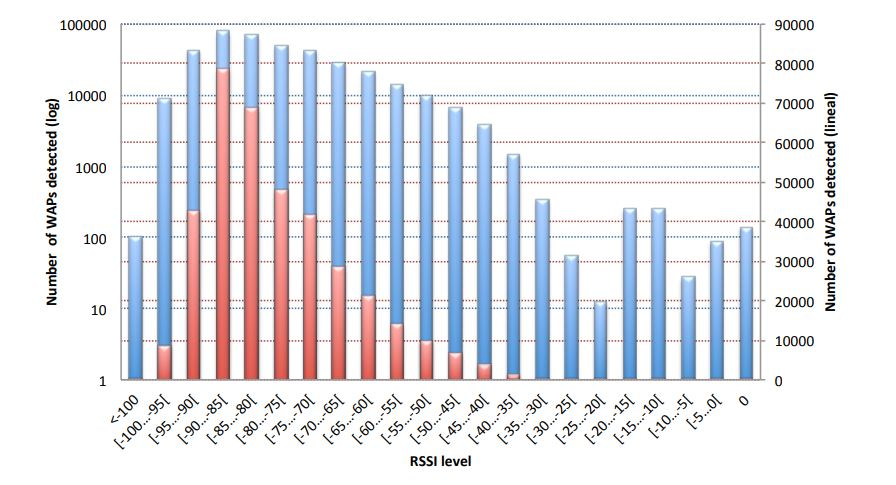

· **521-523 Real world coordinates of the sample points**:

Real-world coordinates are
represented in each sample/capture by means of three values in
each record (vector positions from 521 to 523), the longitude
and latitude coordinates (in meters with UTM from WGS84)
and the floor of the building.

· **524 BuildingID**:

BuildingID, vector position 524, is an
integer value (from 0 to 2) that corresponds to the building
in which the capture was taken. Figure VI shows: the UJI
University campus (left); the three buildings of the School
of Technology and Experimental Sciences (center image),
hereafter ESTCE; and a zoom inside the third floor of the
TI building (right). This figure has been introduced to show
where the example point (Table V) is exactly located. Table
VI shows the BuildingID for each building of the ESTCE

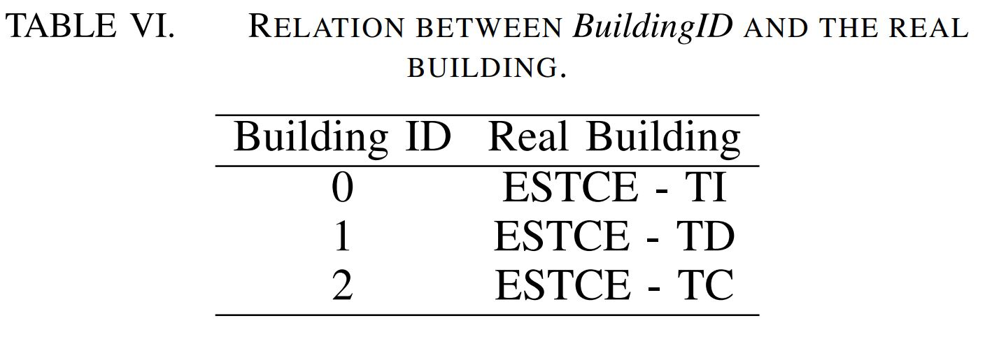

· **525 SpaceID**:  

The position 525 of the vector that represents each sample
is called SpaceID and contains a single integer value that, in
this case, is used to identify the particular space (offices, labs,
etc.) where the capture was taken

· **526 Relative position with respect to SpaceID**:

The relative position with
respect to the space is also provided in the 526 position and
it denotes if the capture was taken inside (value 1) or outside
(value 2) the space at the corridor. Outside means in front of
the door of the space

· **527 UserID**:

UserID, position 527, contains an integer value that ranges from 1 to 18. This value is used
to represent the 18 different users who participated in the
procedure to generate the training samples. This field has not
been recorded in the validation phase, so the default value 0
is used to denote it. The height of each user is also provided.
This information could be useful because the concrete spatial
position of the device has a direct impact on the measured
RSSI values [6].

· **528 PhoneID**:  

Similarly, PhoneID (position 528)
contains an integer value to represent the Android device used
in each capture. Table IX shows the correspondence between
each PhoneID and its associated device (model and version).
Moreover, the device used by each user is also shown. As
mentioned before, users from USER0001 to USER0018 are
those who participated in the procedure of generating the
training set, whereas user USER0000 is used to denote that
the device was used to generate the validation set.

· **529 Timestamp**: 

Finally, we have also included a Timestamp
register in the 529 position of the vector representing the time
(in Unix time format) in which the capture was taken. This
time was set by a centralized server to avoid outliers. The
timestamps provided by each device is not recorded because
the device’s timing settings could be different and we could
not trust on the time provided by them. In fact, wrong timing
settings could add noise to our records or invalidate them. E.g,
a capture taken at morning could be incorrectly stored as taken
at evening

### Training and validation subset


The training subset and the validation subset. In the
training subset, the reference points are well-specified, being
these points captured by, at least, two users. However, in the
validation subset, the measures were taken at arbitrary points as
would happen in a real localization system and, for this reason,
these reference points (identified by SpaceID and Relative
position) are not stored in the validation records. This fact
is denoted by assigning the default value 0 to both fields.

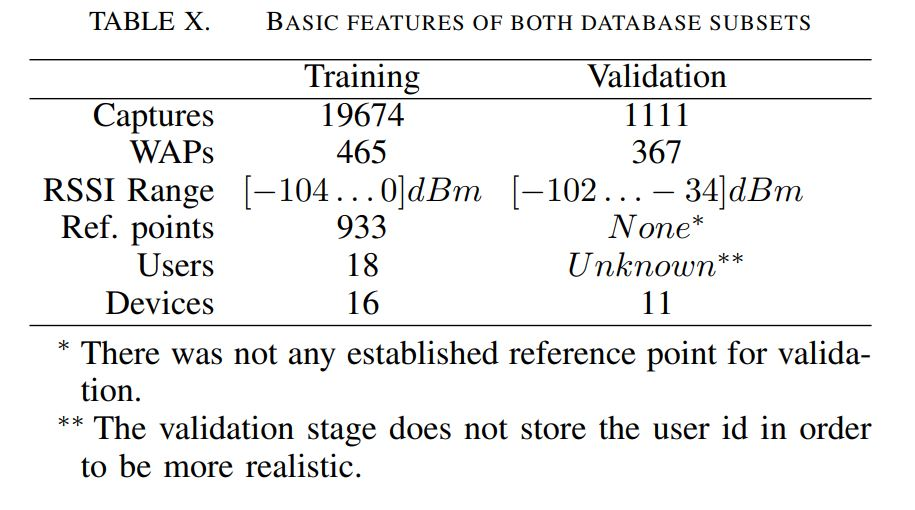

Although both the training subset and the validation subset
contain the same information, the latter includes the value 0 in
some fields. These fields are: SpaceID, Relative Position with
respect to SpaceID and UserID. As it has been commented
before, this information was not recorded because the validation captures were taken at arbitrary points and the users were
not tracked in this phase. This fact tries to simulate a real
localization system.

### Areas of study: 

This database has been initially **generated for indoor localization in our University Campus**. Therefore, testing localization algorithms is the first use that external researchers can do with the published dataset. New indoor localization
algorithms are often proposed using private datasets that are not publicly available, as it has been previously mentioned
in sections I and II. Two different algorithms can be hardly compared only with the information and the results provided
by the authors. **This public dataset can be used to test the accuracy of any localization algorithm based on RSSI levels or
for performing a comparison of localization algorithms under the same experimental framework.**

However, the database is ^**susceptible of being used on alternative problems** that are discussed here. For instance:

• It could be of interest an analysis about **how the internal structure of the building is related with the
WLAN access points** and, therefore, how the number and position of these points can be **optimised** without being out of WiFi range. This could obviously **result in important savings in terms of hardware acquisition and installation efforts**. In summary, a very desirable preprocessing step in any WiFi structure is to reduce the redundant access points keeping a complete coverage.

• WAPs location can be inferred with the databased provided. Although some WAPs are visible, the wide majority of them are hidden to human eye. Commonly, the WLAN antennas are located inside restricted areas or in the ceiling. **The localization of the WAPs can strongly support the localization algorithm.**

• **Detection of low-coverage places such as the ones
recorded in our dataset**. On the one hand, adding new antennas can improve the localization algorithm because those places can not be localized by RSSIbased algorithms. On the other hand, it would **improve the internet connection to those users who are on those places.**

• **Detection of WLAN collision places** where some
WAPs are emitting in the same channel, and WLAN
connectivity may be degraded.

• The **automatically detection of removed and new WAPs** may be interesting since re-mapping could be
avoided. The procedure to fully map a building requires planning, elaboration of a mapping strategy and
working hours. The automatic detection may reduce the maintenance costs of fingerprint databases. In the
introduced database, the validation fingerprints were taken 3 months later than the training ones, and some
WAPs disappeared and new ones were introduced. From the 520 detected WAPs in the UJIIndoorLoc
database, 312 of them were detected in training and validation phases. 153 WAPs were only detected in
the training phase, and 55 new WAPs appeared in the validation phase.

Another practical applications about how devices detect the WAPs are:

• **How two devices differ on obtaining the individual RSSI values on the same place**. Table XII shows
a summary of the RSSI values of the same WAP provided by two different devices. Although the range of possible values is similar for both devices, one of them tends to provide lower values according to the mean and median values.

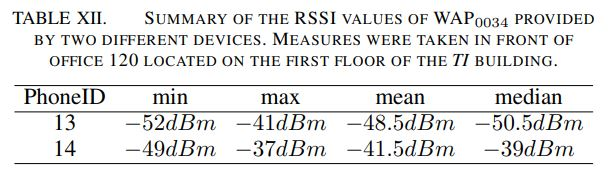
• **The study of anomalies** in data such as the one detailed in Table XIII, where the RSSI values of the same WAP
are shown for 4 different records located in the same place. One of the devices detected the highest possible
Value 0, but the same device detected a very low signal strength in the same place for the same WAP. This
seems to be an anomaly in the data.

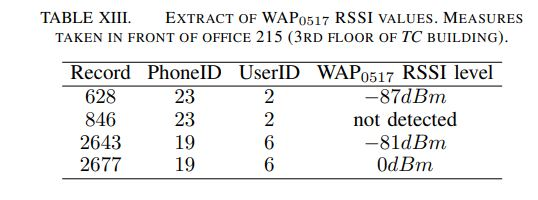

• According to our records, **the number of RSSI scanned by a device depends on the environment and on the
device itself**. Table XIV shows an example of that, where the number of WAPs detected by two devices is shown. It is well known that not all devices detect the same number of WAPs. However, this database not only confirms this fact but a detailed analysis on this sense could be performed.

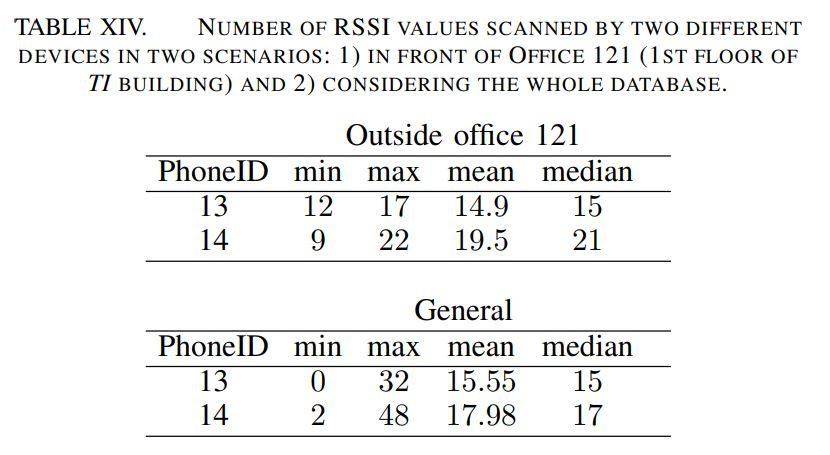

**Note:** All the samples were collected by a
human user because the human body partially blocks the radio
wave communication [36]. Therefore, the samples taken for
UJIIndoorLoc can be considered very realistic. Due to privacy
issues, some information has been anonymized.

To use a cascade model to predict the three variables (Longitude, Latitude, and Floor) based on the predictions of another, you could use the following approach:

Train a machine learning model to predict Longitude based on the 520 independent variables (WAPs) as input.

Use the predicted Longitude as an input along with the 520 WAPs to train a second machine learning model to predict Latitude.

Use the predicted Longitude and Latitude as inputs along with the 520 WAPs to train a third machine learning model to predict Floor.

In this approach, the predicted Longitude and Latitude are used as additional input variables in the subsequent models. This is because the predicted Longitude and Latitude contain valuable information that can help improve the accuracy of the prediction of Floor.

Alternatively, you could also consider training three separate machine learning models, one for each target variable, using the 520 independent variables (WAPs) as input for each model. Then, you could set up a cascade model by using the predicted output of one model as input for the next model. For example, you could use the predicted Longitude to train the model to predict Latitude and use the predicted Longitude and Latitude to train the model to predict Floor. This approach may also work well, depending on the specific characteristics of your data and the machine learning algorithms you are using.

In [8]:
## 2. WAPS are homogenos, meaning they are independent. Expected correlation (to train the model)

## EDA 

In [9]:
## Feature selection: Check correlation with independent values. 
## 1. In this case, WAPs. Same entity but in different location, different from other datasets in which variables are from different nature.
## 2. WAPS are homogenos, meaning they are independent. Expected correlation (to train the model)
## Whith these, predict Longitude, Latitude, Floor and BuildingID

## Model which predicts everything at the same time
## Model which predicts cascade (1, then another) .When predicting building, only use WAP, predict floor using building WAP. Good to use building to predict floor (very good hint to predict floor). 

## Classification problem for building and floor. Performance metrics: Precision, Acurracy, Recall, Kappa Score, Sensitivity, Specificity, F-Score. Decide which is the best
## Regression. R^2, adjusted R^2 and RSME, MAE. 

In [10]:
df.astype(int)

,WAP001,WAP002,WAP003,WAP004,WAP005,WAP006,WAP007,WAP008,WAP009,WAP010,...,WAP520,LONGITUDE,LATITUDE,FLOOR,BUILDINGID,SPACEID,RELATIVEPOSITION,USERID,PHONEID,TIMESTAMP
0,100,100,100,100,100,100,100,100,100,100,...,100,-7541,4864920,2,1,106,2,2,23,1371713733
1,100,100,100,100,100,100,100,100,100,100,...,100,-7536,4864934,2,1,106,2,2,23,1371713691
2,100,100,100,100,100,100,100,-97,100,100,...,100,-7519,4864949,2,1,103,2,2,23,1371714095
3,100,100,100,100,100,100,100,100,100,100,...,100,-7524,4864934,2,1,102,2,2,23,1371713807
4,100,100,100,100,100,100,100,100,100,100,...,100,-7632,4864982,0,0,122,2,11,13,1369909710
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19932,100,100,100,100,100,100,100,100,100,100,...,100,-7485,4864874,3,1,1,2,18,10,1371710683
19933,100,100,100,100,100,100,100,100,100,100,...,100,-7390,4864836,1,2,140,2,18,10,1371710402
19934,100,100,100,100,100,100,100,100,100,100,...,100,-7516,4864889,3,1,13,2,18,10,1371710921
19935,100,100,100,100,100,100,100,100,100,100,...,100,-7537,4864895,3,1,113,2,18,10,1371711049


In [11]:
##MISSING VALUES

In [12]:
df.isnull().sum()

WAP001              0
WAP002              0
WAP003              0
WAP004              0
WAP005              0
                   ..
SPACEID             0
RELATIVEPOSITION    0
USERID              0
PHONEID             0
TIMESTAMP           0
Length: 529, dtype: int64

In [13]:
## DUPLICATES

In [14]:
df.duplicated().sum()

637

In [15]:
missing_summary = df.isnull().describe()
print(missing_summary)

       WAP001 WAP002 WAP003 WAP004 WAP005 WAP006 WAP007 WAP008 WAP009 WAP010  \
count   19937  19937  19937  19937  19937  19937  19937  19937  19937  19937   
unique      1      1      1      1      1      1      1      1      1      1   
top     False  False  False  False  False  False  False  False  False  False   
freq    19937  19937  19937  19937  19937  19937  19937  19937  19937  19937   

        ... WAP520 LONGITUDE LATITUDE  FLOOR BUILDINGID SPACEID  \
count   ...  19937     19937    19937  19937      19937   19937   
unique  ...      1         1        1      1          1       1   
top     ...  False     False    False  False      False   False   
freq    ...  19937     19937    19937  19937      19937   19937   

       RELATIVEPOSITION USERID PHONEID TIMESTAMP  
count             19937  19937   19937     19937  
unique                1      1       1         1  
top               False  False   False     False  
freq              19937  19937   19937     19937  

[4 rows

In [16]:
missing_values = df.isnull().sum(axis=1)
print(missing_values)

0        0
1        0
2        0
3        0
4        0
        ..
19932    0
19933    0
19934    0
19935    0
19936    0
Length: 19937, dtype: int64


In [17]:
df.dropna(axis='rows')

,WAP001,WAP002,WAP003,WAP004,WAP005,WAP006,WAP007,WAP008,WAP009,WAP010,...,WAP520,LONGITUDE,LATITUDE,FLOOR,BUILDINGID,SPACEID,RELATIVEPOSITION,USERID,PHONEID,TIMESTAMP
0,100,100,100,100,100,100,100,100,100,100,...,100,-7541.2643,4.864921e+06,2,1,106,2,2,23,1371713733
1,100,100,100,100,100,100,100,100,100,100,...,100,-7536.6212,4.864934e+06,2,1,106,2,2,23,1371713691
2,100,100,100,100,100,100,100,-97,100,100,...,100,-7519.1524,4.864950e+06,2,1,103,2,2,23,1371714095
3,100,100,100,100,100,100,100,100,100,100,...,100,-7524.5704,4.864934e+06,2,1,102,2,2,23,1371713807
4,100,100,100,100,100,100,100,100,100,100,...,100,-7632.1436,4.864982e+06,0,0,122,2,11,13,1369909710
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19932,100,100,100,100,100,100,100,100,100,100,...,100,-7485.4686,4.864875e+06,3,1,1,2,18,10,1371710683
19933,100,100,100,100,100,100,100,100,100,100,...,100,-7390.6206,4.864836e+06,1,2,140,2,18,10,1371710402
19934,100,100,100,100,100,100,100,100,100,100,...,100,-7516.8415,4.864889e+06,3,1,13,2,18,10,1371710921
19935,100,100,100,100,100,100,100,100,100,100,...,100,-7537.3219,4.864896e+06,3,1,113,2,18,10,1371711049


### Correlation Matrix: 

In [18]:
df

,WAP001,WAP002,WAP003,WAP004,WAP005,WAP006,WAP007,WAP008,WAP009,WAP010,...,WAP520,LONGITUDE,LATITUDE,FLOOR,BUILDINGID,SPACEID,RELATIVEPOSITION,USERID,PHONEID,TIMESTAMP
0,100,100,100,100,100,100,100,100,100,100,...,100,-7541.2643,4.864921e+06,2,1,106,2,2,23,1371713733
1,100,100,100,100,100,100,100,100,100,100,...,100,-7536.6212,4.864934e+06,2,1,106,2,2,23,1371713691
2,100,100,100,100,100,100,100,-97,100,100,...,100,-7519.1524,4.864950e+06,2,1,103,2,2,23,1371714095
3,100,100,100,100,100,100,100,100,100,100,...,100,-7524.5704,4.864934e+06,2,1,102,2,2,23,1371713807
4,100,100,100,100,100,100,100,100,100,100,...,100,-7632.1436,4.864982e+06,0,0,122,2,11,13,1369909710
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19932,100,100,100,100,100,100,100,100,100,100,...,100,-7485.4686,4.864875e+06,3,1,1,2,18,10,1371710683
19933,100,100,100,100,100,100,100,100,100,100,...,100,-7390.6206,4.864836e+06,1,2,140,2,18,10,1371710402
19934,100,100,100,100,100,100,100,100,100,100,...,100,-7516.8415,4.864889e+06,3,1,13,2,18,10,1371710921
19935,100,100,100,100,100,100,100,100,100,100,...,100,-7537.3219,4.864896e+06,3,1,113,2,18,10,1371711049


## STUDYING THE CORRELATION OF WAPS

In [19]:
num = df.drop(["LONGITUDE", "LATITUDE", "FLOOR", "BUILDINGID", "SPACEID", "RELATIVEPOSITION", "USERID", "PHONEID", "TIMESTAMP"], axis=1)

<Figure size 2000x1600 with 0 Axes>

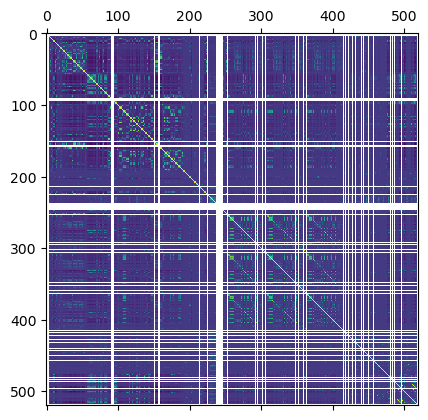

In [20]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(20, 16))
plt.matshow(num.corr())
plt.show()

The potential solutions include the following:

· Remove some of the highly correlated independent variables.

· Linearly combine the independent variables, such as adding them together.

· Partial least squares regression uses principal component analysis to create a set of uncorrelated components to include in the model.

· LASSO and Ridge regression are advanced forms of regression analysis that can handle multicollinearity. 


If you know how to perform linear least squares regression, you’ll be able to handle these analyses with just a little additional study.

In this case, correlation is expected by the very nature of the variables, and will not be considered to make s

In [21]:
cat = df[["LONGITUDE", "LATITUDE", "FLOOR", "BUILDINGID", "SPACEID", "RELATIVEPOSITION", "USERID", "PHONEID", "TIMESTAMP"]]

## Univariate analysis

Categorical values not in the correlation map!!!
High correlation between longitude and latitude is expected, because its an artifical net of ordering. 

In [22]:
df

,WAP001,WAP002,WAP003,WAP004,WAP005,WAP006,WAP007,WAP008,WAP009,WAP010,...,WAP520,LONGITUDE,LATITUDE,FLOOR,BUILDINGID,SPACEID,RELATIVEPOSITION,USERID,PHONEID,TIMESTAMP
0,100,100,100,100,100,100,100,100,100,100,...,100,-7541.2643,4.864921e+06,2,1,106,2,2,23,1371713733
1,100,100,100,100,100,100,100,100,100,100,...,100,-7536.6212,4.864934e+06,2,1,106,2,2,23,1371713691
2,100,100,100,100,100,100,100,-97,100,100,...,100,-7519.1524,4.864950e+06,2,1,103,2,2,23,1371714095
3,100,100,100,100,100,100,100,100,100,100,...,100,-7524.5704,4.864934e+06,2,1,102,2,2,23,1371713807
4,100,100,100,100,100,100,100,100,100,100,...,100,-7632.1436,4.864982e+06,0,0,122,2,11,13,1369909710
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19932,100,100,100,100,100,100,100,100,100,100,...,100,-7485.4686,4.864875e+06,3,1,1,2,18,10,1371710683
19933,100,100,100,100,100,100,100,100,100,100,...,100,-7390.6206,4.864836e+06,1,2,140,2,18,10,1371710402
19934,100,100,100,100,100,100,100,100,100,100,...,100,-7516.8415,4.864889e+06,3,1,13,2,18,10,1371710921
19935,100,100,100,100,100,100,100,100,100,100,...,100,-7537.3219,4.864896e+06,3,1,113,2,18,10,1371711049


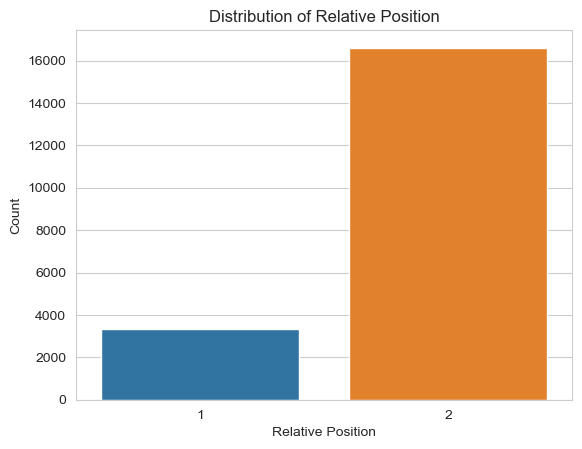

In [23]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style('whitegrid')

# create bar plot with seaborn
a = sns.barplot(x=df['RELATIVEPOSITION'].value_counts().index, y=df['RELATIVEPOSITION'].value_counts())

# set labels and title
a.set(xlabel='Relative Position', ylabel='Count')
a.set_title('Distribution of Relative Position')

plt.show()

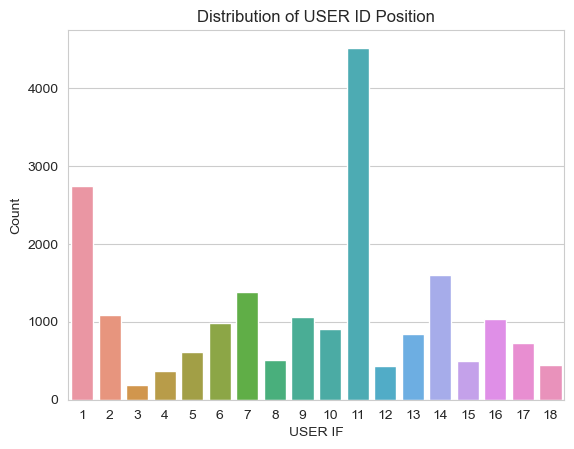

In [24]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style('whitegrid')

# create bar plot with seaborn
a = sns.barplot(x=df['USERID'].value_counts().index, y=df['USERID'].value_counts())

# set labels and title
a.set(xlabel='USER IF', ylabel='Count')
a.set_title('Distribution of USER ID Position')

plt.show()

In [25]:
df['SPACEID'].unique()

array([106, 103, 102, 122, 105, 101, 112, 104, 110, 108, 109, 111, 107,
        15,  29, 117,  16,  28,  22,  10,   2,   4,   3,   5,   6,   9,
        27,   8,   7,  26,  18, 216,  17, 217, 247, 248, 246, 245, 244,
       243, 242, 241, 240, 201, 202, 204, 203, 205, 207, 206, 209, 211,
       208, 210, 212, 214, 213, 215, 121, 219, 221, 222, 218, 220, 250,
       223, 225, 224, 229, 226, 227, 228, 233, 231, 230, 232, 236, 235,
       234, 237, 238, 239, 141, 140, 143, 113, 114, 116, 115, 120, 118,
       128, 119, 129, 125, 124, 131, 127, 132, 126, 133, 134, 137, 135,
       136, 253, 254, 123, 130, 138, 139, 142, 146, 147, 249, 144,   1,
        30,  25,  13,  12,  11,  14])

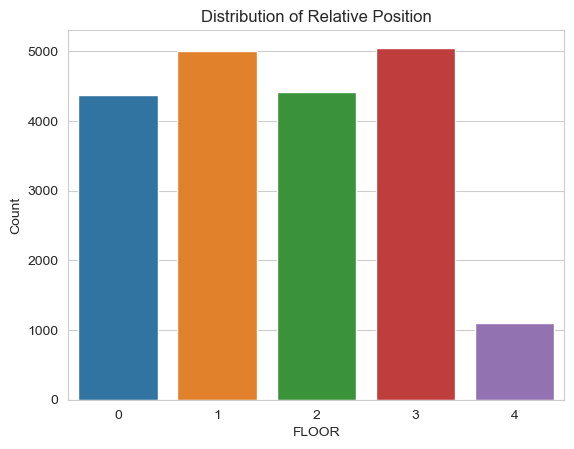

In [26]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style('whitegrid')

# create bar plot with seaborn
a = sns.barplot(x=df['FLOOR'].value_counts().index, y=df['FLOOR'].value_counts())

# set labels and title
a.set(xlabel='FLOOR', ylabel='Count')
a.set_title('Distribution of Relative Position')

plt.show()

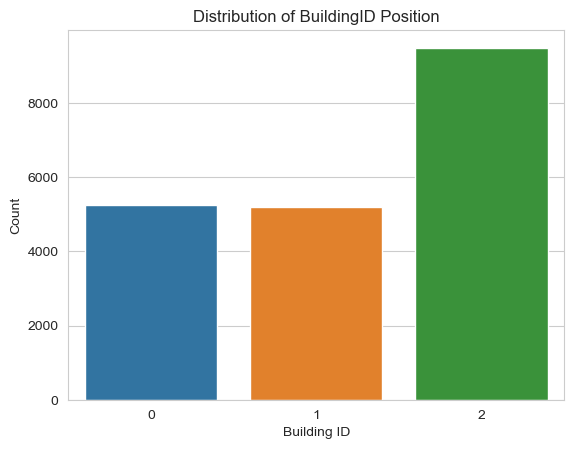

In [27]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style('whitegrid')

# create bar plot with seaborn
a = sns.barplot(x=df['BUILDINGID'].value_counts().index, y=df['BUILDINGID'].value_counts())

# set labels and title
a.set(xlabel='Building ID', ylabel='Count')
a.set_title('Distribution of BuildingID Position')

plt.show()

**CREATING THE VARIABLE BUILDINGFLOOR BY MERGING BUILDING ID AND FLOOR INTO ONE VARIABLE FOR SIMPLICITY WHEN MAKING PREDICTIVE MODELS**

In [28]:
df['BUILDINGFLOOR'] = df['BUILDINGID'].astype(str) + df['FLOOR'].astype(str) 

In [29]:
df_['BUILDINGFLOOR'] = df_['BUILDINGID'].astype(str) + df_['FLOOR'].astype(str) 

In [30]:
df_.astype(int)

,WAP001,WAP002,WAP003,WAP004,WAP005,WAP006,WAP007,WAP008,WAP009,WAP010,...,LONGITUDE,LATITUDE,FLOOR,BUILDINGID,SPACEID,RELATIVEPOSITION,USERID,PHONEID,TIMESTAMP,BUILDINGFLOOR
0,100,100,100,100,100,100,100,100,100,100,...,-7515,4864889,1,1,0,0,0,0,1380872703,11
1,100,100,100,100,100,100,100,100,100,100,...,-7383,4864839,4,2,0,0,0,13,1381155054,24
2,100,100,100,100,100,100,100,100,100,100,...,-7374,4864846,4,2,0,0,0,13,1381155095,24
3,100,100,100,100,100,100,100,100,100,100,...,-7365,4864842,4,2,0,0,0,13,1381155138,24
4,100,100,100,100,100,100,100,100,100,100,...,-7641,4864922,2,0,0,0,0,2,1380877774,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1106,100,100,100,100,100,100,100,100,100,100,...,-7317,4864795,3,2,0,0,0,13,1381156711,23
1107,100,100,100,100,100,100,100,100,100,100,...,-7313,4864792,3,2,0,0,0,13,1381156730,23
1108,100,100,100,100,100,100,100,100,100,100,...,-7637,4864903,0,0,0,0,0,13,1381247781,0
1109,100,100,100,100,100,100,100,100,100,100,...,-7636,4864904,0,0,0,0,0,13,1381247807,0


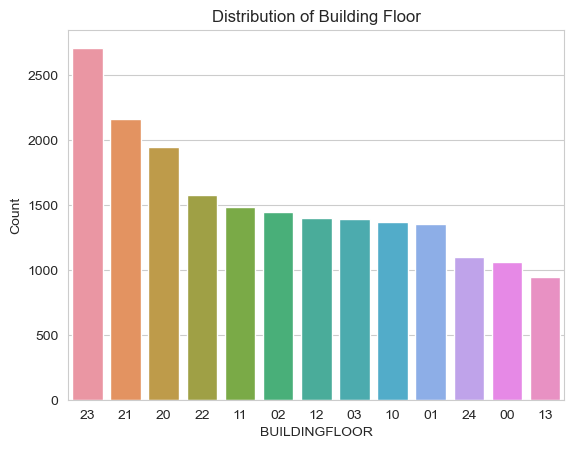

In [31]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style('whitegrid')

# create bar plot with seaborn
a = sns.barplot(x=df['BUILDINGFLOOR'].value_counts().index, y=df['BUILDINGFLOOR'].value_counts())

# set labels and title
a.set(xlabel='BUILDINGFLOOR', ylabel='Count')
a.set_title('Distribution of Building Floor')

plt.show()

The 1st and 3rd building have four floors while the 2nd building has five floors

## MAKING A 3 DIMENSIONAL PLOT

Converting latitude and longitude into two dimensional data: 

## 3 DIMENSIONAL PLOT OF BUILDING AND COORDINATES

In [32]:
df=df.astype(int)

In [33]:
longitude = df['LONGITUDE'].values
latitude = df['LATITUDE'].values
buildingfloor = df['BUILDINGFLOOR'].values
floor = df['FLOOR'].values

MAKE THE LEGEND INTEGER, COLOR BY LABEL. NOT A CONTINUOS VARIABLE

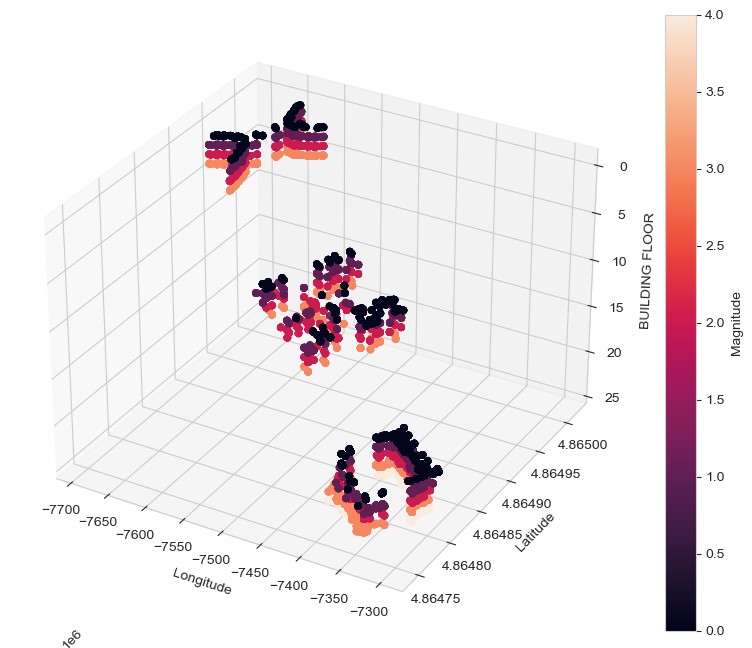

In [34]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
p = ax.scatter(longitude, latitude, buildingfloor, c=floor, marker='o')

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_zlabel('BUILDING FLOOR')
ax.invert_zaxis()
cb = fig.colorbar(p,label='Magnitude')

In [35]:
# Import dependencies
import plotly
import plotly.graph_objs as go

# Configure Plotly to be rendered inline in the notebook.
plotly.offline.init_notebook_mode()

# Configure the trace.
trace = go.Scatter3d(
    x= longitude,  # <-- Put your data instead
    y= latitude,  # <-- Put your data instead
    z= buildingfloor,  # <-- Put your data instead
    mode='markers',
    marker={
        'size': 10,
        'opacity': 0.8,
    }
)

# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0}
)

data = [trace]

plot_figure = go.Figure(data=data, layout=layout)

# Render the plot.
plotly.offline.iplot(plot_figure)

In [159]:
import plotly
import plotly.graph_objs as go

# Configure Plotly to be rendered inline in the notebook.
plotly.offline.init_notebook_mode()

# Configure the trace.
trace = go.Scatter3d(
    x=longitude,
    y=latitude,
    z=buildingfloor,
    mode='markers',
    marker={
        'size': 10,
        'opacity': 0.8,
        'color': floor,  # Add floor as a color
        'colorscale': 'Viridis'  # Choose a color scale
    }
)

# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0},
    scene=dict(
        camera=dict(
            eye=dict(x=1.2, y=1.2, z=1.2)  # Adjust the initial camera view
        )
    )
)

data = [trace]

plot_figure = go.Figure(data=data, layout=layout)

# Create frames for zoom in and zoom out effect
frames = [
    go.Frame(layout=go.Layout(scene_camera_eye=dict(x=0.8, y=0.8, z=0.8))),
    go.Frame(layout=go.Layout(scene_camera_eye=dict(x=1.2, y=1.2, z=1.2)))
]

# Add frames to the figure
plot_figure.frames = frames

# Set animation options
animation_opts = dict(
    frame=dict(duration=500, redraw=True),
    fromcurrent=True
)

# Create animation
animation = dict(
    frame=animation_opts,
    transition=dict(duration=300, easing='quadratic-in-out'),
    mode='immediate'
)

plot_figure.update_layout(
    updatemenus=[
        dict(
            type='buttons',
            buttons=[
                dict(label='Play',
                     method='animate',
                     args=[None, animation])
            ],
            showactive=False
        )
    ]
)

# Render the plot.
plotly.offline.iplot(plot_figure)


In [160]:
import plotly
import plotly.graph_objs as go
import plotly.io as pio

# Configure Plotly to be rendered inline in the notebook.
plotly.offline.init_notebook_mode()

# Configure the trace.
trace = go.Scatter3d(
    x=longitude,
    y=latitude,
    z=buildingfloor,
    mode='markers',
    marker={
        'size': 3,  # Reduce the size of the points
        'opacity': 0.8,
        'color': floor,  # Add floor as a color
        'colorscale': 'Viridis'  # Choose a color scale
    }
)

# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0},
    scene=dict(
        camera=dict(
            eye=dict(x=1.2, y=1.2, z=1.2)  # Adjust the initial camera view
        )
    )
)

data = [trace]

plot_figure = go.Figure(data=data, layout=layout)

# Create frames for zoom in and zoom out effect
frames = [
    go.Frame(layout=go.Layout(scene_camera_eye=dict(x=0.8, y=0.8, z=0.8))),
    go.Frame(layout=go.Layout(scene_camera_eye=dict(x=1.2, y=1.2, z=1.2)))
]

# Add frames to the figure
plot_figure.frames = frames

# Set animation options
animation_opts = dict(
    frame=dict(duration=500, redraw=True),
    fromcurrent=True
)

# Create animation
animation = dict(
    frame=animation_opts,
    transition=dict(duration=300, easing='quadratic-in-out'),
    mode='immediate'
)

plot_figure.update_layout(
    updatemenus=[
        dict(
            type='buttons',
            buttons=[
                dict(label='Play',
                     method='animate',
                     args=[None, animation])
            ],
            showactive=False
        )
    ]
)

# Render the plot.
plotly.offline.iplot(plot_figure)

# Save the GIF
pio.write_html(plot_figure, file='plot_animation.html', auto_open=False)


ADD FLOOR AS COLOR

## PREDICTIVE CLASSIFICATION PROBLEM TO PREDICT BUILDINGFLOOR

### Dividing independent with dependendent variables

In [36]:
independent= df.drop(['BUILDINGFLOOR', "LONGITUDE", "LATITUDE", "FLOOR", "BUILDINGID", "SPACEID", "RELATIVEPOSITION", "USERID", "PHONEID", "TIMESTAMP"], axis=1)
dependent=df[['BUILDINGFLOOR']]

### Setting train test split

In [37]:
independent_train, independent_test, dependent_train, dependent_test = train_test_split(independent, dependent, test_size = 0.2, random_state= 0)

### Decision Tree classifier model before SMOTE

In [38]:
df_.astype(int)

,WAP001,WAP002,WAP003,WAP004,WAP005,WAP006,WAP007,WAP008,WAP009,WAP010,...,LONGITUDE,LATITUDE,FLOOR,BUILDINGID,SPACEID,RELATIVEPOSITION,USERID,PHONEID,TIMESTAMP,BUILDINGFLOOR
0,100,100,100,100,100,100,100,100,100,100,...,-7515,4864889,1,1,0,0,0,0,1380872703,11
1,100,100,100,100,100,100,100,100,100,100,...,-7383,4864839,4,2,0,0,0,13,1381155054,24
2,100,100,100,100,100,100,100,100,100,100,...,-7374,4864846,4,2,0,0,0,13,1381155095,24
3,100,100,100,100,100,100,100,100,100,100,...,-7365,4864842,4,2,0,0,0,13,1381155138,24
4,100,100,100,100,100,100,100,100,100,100,...,-7641,4864922,2,0,0,0,0,2,1380877774,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1106,100,100,100,100,100,100,100,100,100,100,...,-7317,4864795,3,2,0,0,0,13,1381156711,23
1107,100,100,100,100,100,100,100,100,100,100,...,-7313,4864792,3,2,0,0,0,13,1381156730,23
1108,100,100,100,100,100,100,100,100,100,100,...,-7637,4864903,0,0,0,0,0,13,1381247781,0
1109,100,100,100,100,100,100,100,100,100,100,...,-7636,4864904,0,0,0,0,0,13,1381247807,0


In [39]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import DecisionTreeClassifier

algo_tree_before_smote = DecisionTreeClassifier()
model_tree_before_positive = algo_tree_before_smote.fit(independent_train, dependent_train)

In [40]:
predictions_before = model_tree_before_positive.predict(independent_test)

<Axes: xlabel='BUILDINGFLOOR'>

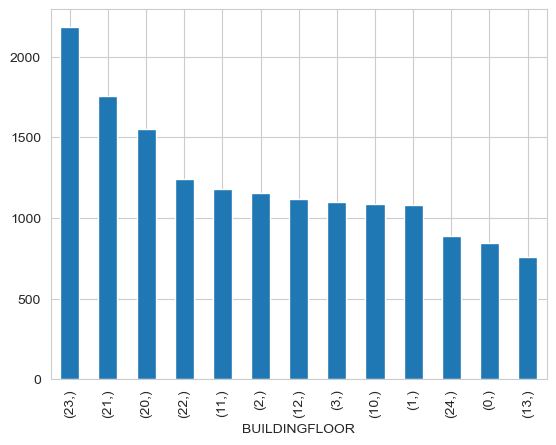

In [41]:
beforesmote = dependent_train.value_counts()
beforesmote.plot.bar()

In [42]:
before_smote_cm = metrics.confusion_matrix(dependent_test, predictions_before)
before_smote_cm

array([[206,   9,   2,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  9, 261,   4,   2,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   9, 273,   4,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,  12, 281,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0, 273,   5,   0,   1,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   2, 297,   1,   0,   0,   0,   0,   1,   0],
       [  0,   0,   0,   0,   0,   4, 262,  10,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   1,   6, 183,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   8, 362,  17,   1,   1,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,  13, 373,  10,  10,   1],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   9, 306,  21,   1],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   3,  13, 504,   4],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   1,   0,   3, 209]])

In [43]:
from sklearn.metrics import classification_report
sklearn.metrics.classification_report(dependent_test, predictions_before)
print(classification_report(dependent_test, predictions_before))

              precision    recall  f1-score   support

           0       0.96      0.95      0.95       217
           1       0.94      0.95      0.94       276
           2       0.94      0.95      0.95       286
           3       0.98      0.96      0.97       293
          10       0.99      0.98      0.99       279
          11       0.97      0.99      0.98       301
          12       0.97      0.95      0.96       276
          13       0.91      0.96      0.93       190
          20       0.97      0.93      0.95       389
          21       0.93      0.92      0.92       407
          22       0.93      0.91      0.92       337
          23       0.93      0.96      0.95       524
          24       0.97      0.98      0.98       213

    accuracy                           0.95      3988
   macro avg       0.95      0.95      0.95      3988
weighted avg       0.95      0.95      0.95      3988



### Decision Tree classifier model after SMOTE (handling class imbalance of target variable)

In [44]:
independent_a_train, independent_a_test, dependent_a_train, dependent_a_test = train_test_split(independent, dependent, test_size = 0.2, random_state= 0)

In [45]:
smt = SMOTE(random_state = 2)
independent_a_train, dependent_a_train = smt.fit_resample(independent_a_train, dependent_a_train)

In [46]:
df

,WAP001,WAP002,WAP003,WAP004,WAP005,WAP006,WAP007,WAP008,WAP009,WAP010,...,LONGITUDE,LATITUDE,FLOOR,BUILDINGID,SPACEID,RELATIVEPOSITION,USERID,PHONEID,TIMESTAMP,BUILDINGFLOOR
0,100,100,100,100,100,100,100,100,100,100,...,-7541,4864920,2,1,106,2,2,23,1371713733,12
1,100,100,100,100,100,100,100,100,100,100,...,-7536,4864934,2,1,106,2,2,23,1371713691,12
2,100,100,100,100,100,100,100,-97,100,100,...,-7519,4864949,2,1,103,2,2,23,1371714095,12
3,100,100,100,100,100,100,100,100,100,100,...,-7524,4864934,2,1,102,2,2,23,1371713807,12
4,100,100,100,100,100,100,100,100,100,100,...,-7632,4864982,0,0,122,2,11,13,1369909710,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19932,100,100,100,100,100,100,100,100,100,100,...,-7485,4864874,3,1,1,2,18,10,1371710683,13
19933,100,100,100,100,100,100,100,100,100,100,...,-7390,4864836,1,2,140,2,18,10,1371710402,21
19934,100,100,100,100,100,100,100,100,100,100,...,-7516,4864889,3,1,13,2,18,10,1371710921,13
19935,100,100,100,100,100,100,100,100,100,100,...,-7537,4864895,3,1,113,2,18,10,1371711049,13


<Axes: xlabel='BUILDINGFLOOR'>

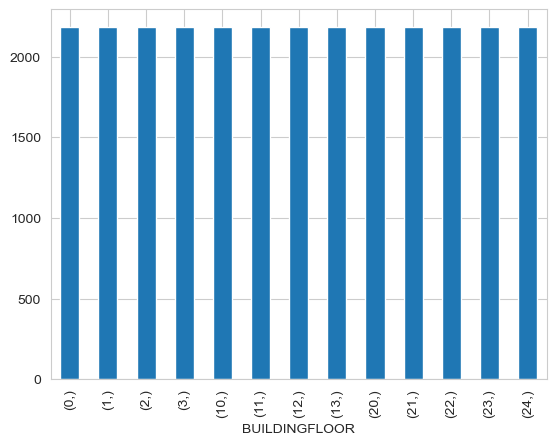

In [47]:
value_counts = dependent_a_train.value_counts()

# Create a bar plot of the value counts
value_counts.plot.bar()

In [48]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import DecisionTreeClassifier

algo_tree_smote = DecisionTreeClassifier()
model_tree_smote = algo_tree_smote.fit(independent_a_train, dependent_a_train)
predictions = model_tree_smote.predict(independent_a_test)

In [49]:
algo_tree_smote

DecisionTreeClassifier()

In [50]:
confusion_matrix = metrics.confusion_matrix(dependent_a_test, predictions)
confusion_matrix

array([[204,  12,   1,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  9, 258,   9,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   9, 267,   9,   0,   0,   0,   1,   0,   0,   0,   0,   0],
       [  0,   1,  12, 279,   0,   0,   1,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0, 273,   5,   1,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   3, 295,   2,   1,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   2,   2, 264,   7,   0,   0,   0,   1,   0],
       [  0,   0,   0,   0,   0,   1,   4, 185,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   9, 365,  15,   0,   0,   0],
       [  0,   0,   0,   0,   0,   3,   0,   0,  12, 368,  18,   5,   1],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   7, 312,  18,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   2,  11,   7, 503,   1],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   2, 211]])

In [51]:
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])

In [52]:
from sklearn.metrics import classification_report
sklearn.metrics.classification_report(dependent_a_test, predictions)
print(classification_report(dependent_a_test, predictions))

              precision    recall  f1-score   support

           0       0.96      0.94      0.95       217
           1       0.92      0.93      0.93       276
           2       0.92      0.93      0.93       286
           3       0.97      0.95      0.96       293
          10       0.98      0.98      0.98       279
          11       0.96      0.98      0.97       301
          12       0.97      0.96      0.96       276
          13       0.91      0.97      0.94       190
          20       0.96      0.94      0.95       389
          21       0.92      0.90      0.91       407
          22       0.93      0.93      0.93       337
          23       0.95      0.96      0.96       524
          24       0.99      0.99      0.99       213

    accuracy                           0.95      3988
   macro avg       0.95      0.95      0.95      3988
weighted avg       0.95      0.95      0.95      3988



### Predictions for BuildingFloor with the validation set

In [53]:
independent_validation = df_.drop(['BUILDINGFLOOR', "LONGITUDE", "LATITUDE", "FLOOR", "BUILDINGID", "SPACEID", "RELATIVEPOSITION", "USERID", "PHONEID", "TIMESTAMP"], axis=1)
dependent_validation=df_[['BUILDINGFLOOR']]

In [54]:
independent_validation=independent_validation.astype("int")
dependent_validation=dependent_validation.astype("int")

In [55]:
predictions_val = model_tree_smote.predict(independent_validation)

In [56]:
predictions_val

array([13, 22, 23, ...,  0,  0,  0])

In [57]:
report_val = classification_report(dependent_validation, predictions_val)
print(report_val)

              precision    recall  f1-score   support

           0       0.75      0.73      0.74        78
           1       0.84      0.72      0.78       208
           2       0.69      0.73      0.71       165
           3       0.77      0.84      0.80        85
          10       0.50      0.77      0.61        30
          11       0.86      0.50      0.63       143
          12       0.57      0.84      0.68        87
          13       0.47      0.64      0.54        47
          20       0.69      0.83      0.75        24
          21       0.82      0.80      0.81       111
          22       0.59      0.48      0.53        54
          23       0.43      0.72      0.54        40
          24       0.68      0.33      0.45        39

    accuracy                           0.69      1111
   macro avg       0.67      0.69      0.66      1111
weighted avg       0.72      0.69      0.69      1111



LAZY CLASSIFIER

In [58]:
###from lazypredict.Supervised import LazyClassifier
###from sklearn.model_selection import train_test_split

In [59]:
df_=df_.astype("int")
df=df.astype("int")

Combining dataframes to test and check the performance with the validation data

In [60]:
test=pd.concat([df, df_])

## MACHINE LEARNING BUILDINGFLOOR

In [61]:
test=pd.concat([df, df_])

### LazyClassifier

**Comment: merging Validation and Training Dataset to pick up best models (Highest R^2) with lowest RMSE**

In [62]:
test=pd.concat([df, df_])

In [63]:
merged_independent_clf = test.drop(['BUILDINGFLOOR', "LONGITUDE", "LATITUDE", "FLOOR", "BUILDINGID", "SPACEID", "RELATIVEPOSITION", "USERID", "PHONEID", "TIMESTAMP"], axis=1)
merged_dependent_clf=test[['BUILDINGFLOOR']]

In [64]:
merged_independent_clf=merged_independent_clf.astype("int")
merged_dependent_clf=merged_dependent_clf.astype("int")

In [65]:
merged_independent_clf_train, merged_independent_clf_test, merged_dependent_clf_train, merged_dependent_clf_test = train_test_split(merged_independent_clf, merged_dependent_clf, test_size = 0.2, random_state= 0)

In [66]:
###clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
###models_clf, predictions_clf = clf.fit(merged_independent_clf_train, merged_independent_clf_test, merged_dependent_clf_train, merged_dependent_clf_test)

In [67]:
###models_clf

**LGBMClassifier**

In [68]:
from lightgbm import LGBMClassifier

In [69]:
algo_LGBMClassifier_building_floor= LGBMClassifier()
model_LGBMClassifier_buildingfloor = algo_LGBMClassifier_building_floor.fit(independent_a_train, dependent_a_train)
predictions_buildingfloor = model_LGBMClassifier_buildingfloor.predict(independent_a_test)

/Users/arnauandrews/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_label.py:99: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/arnauandrews/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_label.py:134: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



**RandomForestClassifier**

In [70]:
from sklearn.ensemble import RandomForestClassifier

In [71]:
algo_RandomForestClassifier_building_floor= RandomForestClassifier()
model_RandomForestClassifier_buildingfloor = algo_RandomForestClassifier_building_floor.fit(independent_a_train, dependent_a_train)
predictions_buildingfloor = model_RandomForestClassifier_buildingfloor.predict(independent_validation)

/var/folders/w5/v8y1xm210p5179rh3_n7sbjw0000gn/T/ipykernel_91801/2667291974.py:2: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



In [72]:
import pandas as pd
final = pd.DataFrame(columns=['A'])

In [73]:
final['predictions_buildingfloor']=predictions_buildingfloor

**ExtraTreesClassifier**

In [74]:
from sklearn.ensemble import ExtraTreesClassifier

In [75]:
algo_ExtraTreesClassifier_building_floor= ExtraTreesClassifier()
model_ExtraTreesClassifier_buildingfloor = algo_ExtraTreesClassifier_building_floor.fit(independent_a_train, dependent_a_train)
predictions_buildingfloor = model_ExtraTreesClassifier_buildingfloor.predict(independent_a_test)

/var/folders/w5/v8y1xm210p5179rh3_n7sbjw0000gn/T/ipykernel_91801/1454298287.py:2: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



In [76]:
value_counts = dependent.value_counts()
value_counts

BUILDINGFLOOR
23               2709
21               2162
20               1942
22               1577
11               1484
2                1443
12               1396
3                1391
10               1368
1                1356
24               1102
0                1059
13                948
dtype: int64

**BaggingClassifier**

In [77]:
from sklearn.ensemble import BaggingClassifier

In [78]:
algo_BaggingClassifier_building_floor= BaggingClassifier()
model_BaggingClassifier_buildingfloor = algo_BaggingClassifier_building_floor.fit(independent_a_train, dependent_a_train)
predictions_BaggingClassifier = model_BaggingClassifier_buildingfloor.predict(independent_a_test)

/Users/arnauandrews/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_bagging.py:802: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



**SVC**

In [79]:
from sklearn.svm import SVC

In [80]:
algo_SVC_building_floor= SVC()
model_SVC_buildingfloor = algo_SVC_building_floor.fit(independent_a_train, dependent_a_train)
predictions_SVC = model_SVC_buildingfloor.predict(independent_a_test)

/Users/arnauandrews/anaconda3/lib/python3.10/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



**DecisionTreeClassifier**

In [81]:
algo_DecisionTree_building_floor= DecisionTreeClassifier()
model_DecisionTree_buildingfloor = algo_DecisionTree_building_floor.fit(independent_a_train, dependent_a_train)
predictions_DecisionTree = model_DecisionTree_buildingfloor.predict(independent_a_test)

In [82]:
independent

,WAP001,WAP002,WAP003,WAP004,WAP005,WAP006,WAP007,WAP008,WAP009,WAP010,...,WAP511,WAP512,WAP513,WAP514,WAP515,WAP516,WAP517,WAP518,WAP519,WAP520
0,100,100,100,100,100,100,100,100,100,100,...,100,100,100,100,100,100,100,100,100,100
1,100,100,100,100,100,100,100,100,100,100,...,100,100,100,100,100,100,100,100,100,100
2,100,100,100,100,100,100,100,-97,100,100,...,100,100,100,100,100,100,100,100,100,100
3,100,100,100,100,100,100,100,100,100,100,...,100,100,100,100,100,100,100,100,100,100
4,100,100,100,100,100,100,100,100,100,100,...,100,100,100,100,100,100,100,100,100,100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19932,100,100,100,100,100,100,100,100,100,100,...,100,100,100,100,100,100,100,100,100,100
19933,100,100,100,100,100,100,100,100,100,100,...,100,100,100,100,100,100,100,100,100,100
19934,100,100,100,100,100,100,100,100,100,100,...,100,100,100,100,100,100,100,100,100,100
19935,100,100,100,100,100,100,100,100,100,100,...,100,100,100,100,100,100,100,100,100,100


### Predictions Building Floor / Accuracy / Recall / F-1 Score 

In [83]:
independent_validation_buildingfloor= df_.drop(['BUILDINGFLOOR', "LONGITUDE", "LATITUDE", "FLOOR", "BUILDINGID", "SPACEID", "RELATIVEPOSITION", "USERID", "PHONEID", "TIMESTAMP"], axis=1)
dependent_validation_buildingfloor=df_[['BUILDINGFLOOR']]

independent_validation_buildingfloor=independent_validation_buildingfloor.astype("int")
dependent_validation_buildingfloor=dependent_validation_buildingfloor.astype("int")

**LGBM Classifier: Predictions Building Floor / Accuracy / Recall / F-1 Score with validation set**

In [84]:
from sklearn.metrics import recall_score, f1_score, accuracy_score

In [85]:
predictions_val_buildingfloor_LGBM = model_LGBMClassifier_buildingfloor.predict(independent_validation_buildingfloor)

In [86]:
recall_lgbm = recall_score(dependent_validation_buildingfloor, predictions_val_buildingfloor_LGBM, average='macro')
f1_lgbm = f1_score(dependent_validation_buildingfloor, predictions_val_buildingfloor_LGBM, average='macro')
accuracy_lgbm = accuracy_score(dependent_validation_buildingfloor, predictions_val_buildingfloor_LGBM)

print("Macro Average Recall: {:.3f}".format(recall_lgbm))
print("Macro Average F1 Score: {:.3f}".format(f1_lgbm))
print("Accuracy: {:.3f}".format(accuracy_lgbm))

Macro Average Recall: 0.853
Macro Average F1 Score: 0.829
Accuracy: 0.863


**RandomForestClassifier**: Predictions Building Floor / Accuracy / Recall / F-1 Score with validation set

In [87]:
predictions_val_buildingfloor_RandomForestClassifier = model_RandomForestClassifier_buildingfloor.predict(independent_validation_buildingfloor)

In [88]:
recall_random = recall_score(dependent_validation_buildingfloor, predictions_val_buildingfloor_RandomForestClassifier, average='macro')
f1_random = f1_score(dependent_validation_buildingfloor, predictions_val_buildingfloor_RandomForestClassifier, average='macro')
accuracy_random = accuracy_score(dependent_validation_buildingfloor, predictions_val_buildingfloor_RandomForestClassifier)

print("Macro Average Recall: {:.3f}".format(recall_random))
print("Macro Average F1 Score: {:.3f}".format(f1_random))
print("Accuracy: {:.3f}".format(accuracy_random))

Macro Average Recall: 0.853
Macro Average F1 Score: 0.844
Accuracy: 0.871


**ExtraTreesClassifier**: Predictions Building Floor / Accuracy / Recall / F-1 Score with validation set**

In [89]:
predictions_val_buildingfloor_ExtraTreesClassifier = model_ExtraTreesClassifier_buildingfloor.predict(independent_validation_buildingfloor)

In [90]:
recall_extra = recall_score(dependent_validation_buildingfloor, predictions_val_buildingfloor_ExtraTreesClassifier, average='macro')
f1_extra = f1_score(dependent_validation_buildingfloor, predictions_val_buildingfloor_ExtraTreesClassifier, average='macro')
accuracy_extra = accuracy_score(dependent_validation_buildingfloor, predictions_val_buildingfloor_ExtraTreesClassifier)

print("Macro Average Recall: {:.3f}".format(recall_extra))
print("Macro Average F1 Score: {:.3f}".format(f1_extra))
print("Accuracy: {:.3f}".format(accuracy_extra))

Macro Average Recall: 0.845
Macro Average F1 Score: 0.835
Accuracy: 0.854


**BaggingClassifier**: Predictions Building Floor / Accuracy / Recall / F-1 Score with validation set**

In [91]:
predictions_val_buildingfloor_BaggingClassifier = model_BaggingClassifier_buildingfloor.predict(independent_validation_buildingfloor)

In [92]:
recall_bagging = recall_score(dependent_validation_buildingfloor, predictions_val_buildingfloor_BaggingClassifier, average='macro')
f1_bagging = f1_score(dependent_validation_buildingfloor, predictions_val_buildingfloor_BaggingClassifier, average='macro')
accuracy_bagging = accuracy_score(dependent_validation_buildingfloor, predictions_val_buildingfloor_BaggingClassifier)

print("Macro Average Recall: {:.3f}".format(recall_bagging))
print("Macro Average F1 Score: {:.3f}".format(f1_bagging))
print("Accuracy: {:.3f}".format(accuracy_bagging))

Macro Average Recall: 0.775
Macro Average F1 Score: 0.756
Accuracy: 0.784


**SVC**: Predictions Building Floor / Accuracy / Recall / F-1 Score with validation set**

In [93]:
predictions_val_buildingfloor_SVC = model_SVC_buildingfloor.predict(independent_validation_buildingfloor)

In [94]:
recall_SVC = recall_score(dependent_validation_buildingfloor, predictions_val_buildingfloor_SVC, average='macro')
f1_SVC = f1_score(dependent_validation_buildingfloor, predictions_val_buildingfloor_SVC, average='macro')
accuracy_SVC = accuracy_score(dependent_validation_buildingfloor, predictions_val_buildingfloor_SVC)

print("Macro Average Recall: {:.3f}".format(recall_SVC))
print("Macro Average F1 Score: {:.3f}".format(f1_SVC))
print("Accuracy: {:.3f}".format(accuracy_SVC))

Macro Average Recall: 0.799
Macro Average F1 Score: 0.792
Accuracy: 0.802


In [95]:
predictions_DecisionTree= model_DecisionTree_buildingfloor.predict(independent_validation_buildingfloor)

In [96]:
recall_tree = recall_score(dependent_validation_buildingfloor, predictions_DecisionTree, average='macro')
f1_tree = f1_score(dependent_validation_buildingfloor, predictions_DecisionTree, average='macro')
accuracy_tree = accuracy_score(dependent_validation_buildingfloor, predictions_DecisionTree)

print("Macro Average Recall: {:.3f}".format(recall_tree))
print("Macro Average F1 Score: {:.3f}".format(f1_tree))
print("Accuracy: {:.3f}".format(accuracy_tree))

Macro Average Recall: 0.687
Macro Average F1 Score: 0.664
Accuracy: 0.698


## MACHINE LEARNING LONGITUDE

In [97]:
df = df.astype(int)

### LazyRegressor 

**Comment: merging Validation and Training Dataset to pick up best models (Highest R^2) with lowest RMSE**

In [98]:
test=pd.concat([df, df_])

In [99]:
merged_independent= test.drop(['BUILDINGFLOOR', "LONGITUDE", "LATITUDE", "FLOOR", "BUILDINGID", "SPACEID", "RELATIVEPOSITION", "USERID", "PHONEID", "TIMESTAMP"], axis=1)
merged_dependent=test[['LONGITUDE']]

merged_independent=merged_independent.astype("int")
merged_dependent=merged_dependent.astype("int")

merged_independent_train, merged_independent_test, merged_dependent_train, merged_dependent_test = train_test_split(merged_independent, merged_dependent, test_size = 0.2, random_state= 0)

In [100]:
### from lazypredict.Supervised import LazyRegressor
### from sklearn import datasets
### from sklearn.utils import shuffle
### import numpy as np


### reg = LazyRegressor(verbose=0, ignore_warnings=False, custom_metric=None)
### models_regressor_longitude, predictions_regressor_longitude = reg.fit(merged_independent_train, merged_independent_test, merged_dependent_train, merged_dependent_test)

### print(models_regressor_longitude)

In [101]:
### models_regressor_longitude

### Dividing target and predictor variables

In [102]:
independent_long= df.drop(['BUILDINGFLOOR', "LONGITUDE", "LATITUDE", "FLOOR", "BUILDINGID", "SPACEID", "RELATIVEPOSITION", "USERID", "PHONEID", "TIMESTAMP"], axis=1)
dependent_long=df[['LONGITUDE']]

### Train / Test Split

In [103]:
independent_long_train, independent_long_test, dependent_long_train, dependent_long_test = train_test_split(independent_long, dependent_long, test_size = 0.2, random_state= 0)

### MODELING

#### Decision Tree Regressor Model

In [104]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeRegressor
algo_DecisionTreeRegressor_longitude= DecisionTreeRegressor()
model_DecisionTreeRegressor_longitude = algo_DecisionTreeRegressor_longitude.fit(independent_long_train, dependent_long_train)
predictions_longitude = model_DecisionTreeRegressor_longitude.predict(independent_long_test)

#### Extra Trees Regressor Model

In [105]:
from sklearn.ensemble import ExtraTreesClassifier
algo_ExtraTreesClassifier_longitude = ExtraTreesClassifier()
# fit the model on the whole dataset
model_ExtraTreesClassifier_longitude = algo_ExtraTreesClassifier_longitude.fit(independent_long_train, dependent_long_train)
predictions_longitude = model_ExtraTreesClassifier_longitude.predict(independent_long_test)

/var/folders/w5/v8y1xm210p5179rh3_n7sbjw0000gn/T/ipykernel_91801/2044059263.py:4: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



#### RandomForestRegressor

In [106]:
from sklearn.ensemble import RandomForestRegressor
algo_RandomForestRegressor_longitude = RandomForestRegressor()
# fit the model on the whole dataset
model_RandomForestRegressor_longitude = algo_RandomForestRegressor_longitude.fit(independent_long_train, dependent_long_train)
predictions_longitude = model_RandomForestRegressor_longitude.predict(independent_long_test)

/var/folders/w5/v8y1xm210p5179rh3_n7sbjw0000gn/T/ipykernel_91801/3748906902.py:4: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



#### BaggingRegressor

In [107]:
from sklearn.ensemble import BaggingRegressor
algo_BaggingRegressor_longitude = BaggingRegressor()
# fit the model on the whole dataset
model_BaggingRegressor_longitude = algo_BaggingRegressor_longitude.fit(independent_long_train, dependent_long_train)
predictions_longitude = model_BaggingRegressor_longitude.predict(independent_long_test)

/Users/arnauandrews/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_bagging.py:508: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



#### LGBMRegressor

In [108]:
from lightgbm import LGBMRegressor
algo_LGBMRegressor_longitude =  LGBMRegressor()
# fit the model on the whole dataset
model_LGBMRegressor_longitude = algo_LGBMRegressor_longitude.fit(independent_long_train, dependent_long_train)
predictions_longitude = model_LGBMRegressor_longitude.predict(independent_long_test)

### Predictions Longitude / MSE and R-squared with validation set. Testing different models

In [109]:
independent_validation_long= df_.drop(['BUILDINGFLOOR', "LONGITUDE", "LATITUDE", "FLOOR", "BUILDINGID", "SPACEID", "RELATIVEPOSITION", "USERID", "PHONEID", "TIMESTAMP"], axis=1)
dependent_validation_long=df_[['LONGITUDE']]

**Decision Tree Regressor: Predictions Longitude / MSE and R-squared with validation set**

In [110]:
predictions_val_longitude_decision_Tree_Regressor = model_DecisionTreeRegressor_longitude.predict(independent_validation_long)

In [111]:
mse_tree = mean_squared_error(dependent_validation_long, predictions_val_longitude_decision_Tree_Regressor)
r2_tree = r2_score(dependent_validation_long, predictions_val_longitude_decision_Tree_Regressor)

print("Mean Squared Error (MSE):", mse_tree)
print("R-squared (R2):", r2_tree)

Mean Squared Error (MSE): 387.00600694835117
R-squared (R2): 0.9731913630568401


**ExtraTreesRegressor Longitude: Predictions Longitude / MSE and R-squared with validation set**

In [112]:
predictions_val_longitude_decision_Extra_Trees = model_ExtraTreesClassifier_longitude.predict(independent_validation_long)

In [113]:
mse_extra = mean_squared_error(dependent_validation_long, predictions_val_longitude_decision_Extra_Trees)
r2_extra = r2_score(dependent_validation_long, predictions_val_longitude_decision_Extra_Trees)

print("Mean Squared Error (MSE):", mse_extra)
print("R-squared (R2):", r2_extra)

Mean Squared Error (MSE): 122.72007200720073
R-squared (R2): 0.991498948861229


**RandomForestRegressor Longitude: Predictions Longitude / MSE and R-squared with validation set**

In [114]:
predictions_val_longitude_RandomForestRegressor = model_RandomForestRegressor_longitude.predict(independent_validation_long)

mse_random = mean_squared_error(dependent_validation_long, predictions_val_longitude_RandomForestRegressor)
r2_random = r2_score(dependent_validation_long, predictions_val_longitude_RandomForestRegressor)

print("Mean Squared Error (MSE):", mse_random)
print("R-squared (R2):", r2_random)

Mean Squared Error (MSE): 230.1338752882769
R-squared (R2): 0.9840581918622539


**BaggingRegressor Longitude: Predictions Longitude / MSE and R-squared with validation set**

In [115]:
predictions_val_longitude_BaggingRegressor = model_BaggingRegressor_longitude.predict(independent_validation_long)

mse_bagging = mean_squared_error(dependent_validation_long, predictions_val_longitude_BaggingRegressor)
r2_bagging = r2_score(dependent_validation_long, predictions_val_longitude_BaggingRegressor)

print("Mean Squared Error (MSE):", mse_bagging)
print("R-squared (R2):", r2_bagging)

Mean Squared Error (MSE): 264.23317313769365
R-squared (R2): 0.9816960691053745


**LGBMRegressor: Predictions Longitude / MSE and R-squared with validation set**

In [116]:
predictions_val_longitude_LGBMRegressor = model_LGBMRegressor_longitude.predict(independent_validation_long)

mse_lgbm = mean_squared_error(dependent_validation_long, predictions_val_longitude_LGBMRegressor)
r2_lgbm = r2_score(dependent_validation_long, predictions_val_longitude_LGBMRegressor)

print("Mean Squared Error (MSE):", mse_lgbm)
print("R-squared (R2):", r2_lgbm)

Mean Squared Error (MSE): 404.87978047997234
R-squared (R2): 0.9719532130105607


## MACHINE LEARNING LATITUDE

### LazyRegressor  LATITUDE

**Comment: merging Validation and Training Dataset to pick up best models (Highest R^2) with lowest RMSE**

In [117]:
###from lazypredict.Supervised import LazyRegressor
###from sklearn import datasets
###from sklearn.utils import shuffle
import numpy as np


###reg = LazyRegressor(verbose=0, ignore_warnings=False, custom_metric=None)
###models_regressor_latitude, predictions_regressor_latitude = reg.fit(merged_independent_lat_train, merged_independent_lat_test, merged_dependent_lat_train, merged_dependent_lat_test)

###print(models_regressor_latitude)

In [118]:
###models_regressor_latitude

### Dividing independent with dependendent variables

In [119]:
independent_lat = df.drop(["BUILDINGFLOOR", "LONGITUDE", "LATITUDE", "FLOOR", "BUILDINGID", "SPACEID", "RELATIVEPOSITION", "USERID", "PHONEID", "TIMESTAMP"], axis=1)
dependent_lat = df["LATITUDE"]

### Train / Test Split

In [120]:
independent_lat_train, independent_lat_test, dependent_lat_train, dependent_lat_test = train_test_split(independent_lat, dependent_lat, test_size = 0.2, random_state= 0)

### MODELING

#### Decision Tree Regressor Model

In [121]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeRegressor
algo_DecisionTreeRegressor_latitude= DecisionTreeRegressor()
model_DecisionTreeRegressor_latitude = algo_DecisionTreeRegressor_latitude.fit(independent_lat_train, dependent_lat_train)

#### Extra Trees Regressor Model

In [122]:
from sklearn.ensemble import ExtraTreesRegressor
algo_ExtraTreesRegressor_latitude = ExtraTreesRegressor()
model_ExtraTreesRegressor_latitude = algo_ExtraTreesRegressor_latitude.fit(independent_lat_train, dependent_lat_train)

#### RandomForestRegressor

In [123]:
from sklearn.ensemble import RandomForestRegressor
algo_RandomForestRegressor_latitude = RandomForestRegressor()
# fit the model on the whole dataset
model_RandomForestRegressor_latitude = algo_RandomForestRegressor_latitude.fit(independent_lat_train, dependent_lat_train)

#### BaggingRegressor

In [124]:
from sklearn.ensemble import BaggingRegressor
algo_BaggingRegressor_latitude = BaggingRegressor()
# fit the model on the whole dataset
model_BaggingRegressor_latitude = algo_BaggingRegressor_latitude.fit(independent_lat_train, dependent_lat_train)
predictions_latitude= model_BaggingRegressor_latitude.predict(independent_lat_test)

#### LGBMRegressor

In [125]:
from lightgbm import LGBMRegressor
algo_LGBMRegressor_latitude =  LGBMRegressor()
# fit the model on the whole dataset
model_LGBMRegressor_latitude = algo_LGBMRegressor_latitude.fit(independent_lat_train, dependent_lat_train)

### Predictions Latitude / MSE and R-squared with validation set. Testing different models

In [126]:
independent_validation_lat= df_.drop(['BUILDINGFLOOR', "LONGITUDE", "LATITUDE", "FLOOR", "BUILDINGID", "SPACEID", "RELATIVEPOSITION", "USERID", "PHONEID", "TIMESTAMP"], axis=1)
dependent_validation_lat=df_[['LATITUDE']]

**Decision Tree Regressor: Predictions Latitude / MSE and R-squared with validation set**

In [127]:
predictions_val_latitude_decision_Tree_Regressor = model_DecisionTreeRegressor_latitude.predict(independent_validation_lat)
mse_tree_lat = mean_squared_error(dependent_validation_lat, predictions_val_latitude_decision_Tree_Regressor)
r2_tree_lat = r2_score(dependent_validation_lat, predictions_val_latitude_decision_Tree_Regressor)

print("Mean Squared Error (MSE):", mse_tree_lat)
print("R-squared (R2):", r2_tree_lat)

Mean Squared Error (MSE): 380.37426603988524
R-squared (R2): 0.922879177629439


**ExtraTreesRegressor Latitude: Predictions Latitude / MSE and R-squared with validation set**

In [128]:
predictions_val_latitude_Extra_Trees = model_ExtraTreesRegressor_latitude.predict(independent_validation_lat)
mse_extra_lat = mean_squared_error(dependent_validation_lat, predictions_val_latitude_Extra_Trees)
r2_extra_lat = r2_score(dependent_validation_lat, predictions_val_latitude_Extra_Trees)

print("Mean Squared Error (MSE):", mse_extra_lat)
print("R-squared (R2):", r2_extra_lat)

Mean Squared Error (MSE): 178.82312964248047
R-squared (R2): 0.9637436387048869


**BEST MODEL SO FAR: LEAST SQUARED ERROR WITH MOST R^2**

**RandomForestRegressor Latitude: Predictions Latitude / MSE and R-squared with validation set**

In [129]:
predictions_val_latitude_RandomForestRegressor = model_RandomForestRegressor_latitude.predict(independent_validation_lat)
mse_random_lat = mean_squared_error(dependent_validation_lat, predictions_val_latitude_RandomForestRegressor)
r2_random_lat = r2_score(dependent_validation_lat, predictions_val_latitude_RandomForestRegressor)

print("Mean Squared Error (MSE):", mse_random_lat)
print("R-squared (R2):", r2_random_lat)

Mean Squared Error (MSE): 190.2765835049862
R-squared (R2): 0.9614214527430031


**BaggingRegressor Latitude: Predictions Latitude / MSE and R-squared with validation set**

In [130]:
predictions_val_latitude_BaggingRegressor = model_BaggingRegressor_latitude.predict(independent_validation_lat)

mse_bagging_lat = mean_squared_error(dependent_validation_lat, predictions_val_latitude_BaggingRegressor)
r2_bagging_lat = r2_score(dependent_validation_lat, predictions_val_latitude_BaggingRegressor)

print("Mean Squared Error (MSE):", mse_bagging_lat)
print("R-squared (R2):", r2_bagging_lat)

Mean Squared Error (MSE): 227.91093946795732
R-squared (R2): 0.95379109301476


**LGBMRegressor: Predictions Latitude / MSE and R-squared with validation set**

In [131]:
predictions_val_latitude_LGBMRegressor = model_LGBMRegressor_latitude.predict(independent_validation_lat)

mse_lgbm_lat = mean_squared_error(dependent_validation_lat, predictions_val_latitude_LGBMRegressor)
r2_lgbm_lat = r2_score(dependent_validation_lat, predictions_val_latitude_LGBMRegressor)

print("Mean Squared Error (MSE):", mse_lgbm_lat)
print("R-squared (R2):", r2_lgbm_lat)

Mean Squared Error (MSE): 286.7038751694881
R-squared (R2): 0.9418708345859047


**SELECTING THE BEST MODEL**

In [132]:
import pandas as pd

# Define values for variables
Model_Longitude = ['Decision Tree Regressor', 'Extra Trees Regressor', 'RandomForestRegressor', 'BaggingRegressor', 'LGBMRegressor']
R_Squared_Longitude = [r2_tree, r2_extra, r2_random, r2_bagging, r2_lgbm]
RMSE_Longitude = [mse_tree, mse_extra, mse_random, mse_bagging, mse_lgbm]
Null = [0, 0, 0, 0, 0]


Model_Latitude = ['Decision Tree Regressor', 'Extra Trees Regressor', 'RandomForestRegressor', 'BaggingRegressor', 'LGBMRegressor']
R_Squared_Latitude = [r2_tree_lat, r2_extra_lat, r2_random_lat, r2_bagging_lat, r2_lgbm_lat]
RMSE_Latitude = [mse_tree_lat, mse_extra_lat, mse_random_lat, mse_bagging_lat, mse_lgbm_lat]

Model_Building_Floor = ['LGBMClassifier', 'RandomForestClassifier', 'ExtraTreesClassifier', 'BaggingClassifier', 'SVC']
Recall = [recall_lgbm, recall_random, recall_extra, recall_bagging, recall_SVC]
F1_Score = [f1_lgbm, f1_random, f1_extra, f1_bagging, f1_SVC]
Accuracy = [accuracy_lgbm, accuracy_random, accuracy_extra, accuracy_bagging, accuracy_SVC]


# Create a dataframe
evaluation = pd.DataFrame({'Model_Longitude': Model_Longitude, 'R_Squared_Longitude': R_Squared_Longitude, 'RMSE_Longitude': RMSE_Longitude,
                          'Model_Latitude': Model_Latitude, 'R_Squared_Latitude': R_Squared_Latitude, 'RMSE_Latitude': RMSE_Latitude,
                          'Model_Building_Floor': Model_Building_Floor, 'Recall': Recall, 'F1_Score': F1_Score, "Accuracy": Accuracy})

# Print the dataframe
print(evaluation)

           Model_Longitude  R_Squared_Longitude  RMSE_Longitude  \
0  Decision Tree Regressor             0.973191      387.006007   
1    Extra Trees Regressor             0.991499      122.720072   
2    RandomForestRegressor             0.984058      230.133875   
3         BaggingRegressor             0.981696      264.233173   
4            LGBMRegressor             0.971953      404.879780   

            Model_Latitude  R_Squared_Latitude  RMSE_Latitude  \
0  Decision Tree Regressor            0.922879     380.374266   
1    Extra Trees Regressor            0.963744     178.823130   
2    RandomForestRegressor            0.961421     190.276584   
3         BaggingRegressor            0.953791     227.910939   
4            LGBMRegressor            0.941871     286.703875   

     Model_Building_Floor    Recall  F1_Score  Accuracy  
0          LGBMClassifier  0.852589  0.829325  0.863186  
1  RandomForestClassifier  0.852707  0.844220  0.871287  
2    ExtraTreesClassifier  0.845

In [133]:
# Define values for variables
Model_Longitude = ['Decision Tree Regressor', 'Extra Trees Regressor', 'RandomForestRegressor', 'BaggingRegressor', 'LGBMRegressor']
R_Squared_Longitude = [0.97, 0.99, 0.98, 0.98, 0.97]
RMSE_Longitude = [367.12, 152.53, 233.42, 282.84, 404.88]


Model_Latitude = ['Decision Tree Regressor', 'Extra Trees Regressor', 'RandomForestRegressor', 'BaggingRegressor', 'LGBMRegressor']
R_Squared_Latitude = [0.93, 0.97, 0.96, 0.96, 0.94]
RMSE_Latitude = [363.11, 133.62, 206.61, 195.09, 286.70]

Model_Building_Floor = ['LGBMClassifier', 'RandomForestClassifier', 'ExtraTreesClassifier', 'BaggingClassifier', 'SVC']
Recall = [0.85, 0.85, 0.86, 0.77, 0.80]
F1_Score = [0.82, 0.85, 0.85, 0.75, 0.79]
Accuracy = [0.86, 0.87, 0.87, 0.78, 0.80]


# Create a dataframe
param = pd.DataFrame({'Model_Longitude': Model_Longitude, 'R_Squared_Longitude': R_Squared_Longitude, 'RMSE_Longitude': RMSE_Longitude,
                          'Model_Latitude': Model_Latitude, 'R_Squared_Latitude': R_Squared_Latitude, 'RMSE_Latitude': RMSE_Latitude,
                          'Model_Building_Floor': Model_Building_Floor, 'Recall': Recall, 'F1_Score': F1_Score, "Accuracy": Accuracy})

# Print the dataframe
print(param)

           Model_Longitude  R_Squared_Longitude  RMSE_Longitude  \
0  Decision Tree Regressor                 0.97          367.12   
1    Extra Trees Regressor                 0.99          152.53   
2    RandomForestRegressor                 0.98          233.42   
3         BaggingRegressor                 0.98          282.84   
4            LGBMRegressor                 0.97          404.88   

            Model_Latitude  R_Squared_Latitude  RMSE_Latitude  \
0  Decision Tree Regressor                0.93         363.11   
1    Extra Trees Regressor                0.97         133.62   
2    RandomForestRegressor                0.96         206.61   
3         BaggingRegressor                0.96         195.09   
4            LGBMRegressor                0.94         286.70   

     Model_Building_Floor  Recall  F1_Score  Accuracy  
0          LGBMClassifier    0.85      0.82      0.86  
1  RandomForestClassifier    0.85      0.85      0.87  
2    ExtraTreesClassifier    0.86     

NOTE: SSTART WITH BUILDINGID, ALSO CLASSSIFICATION. THEN FLOOR THEN LATITUDE AND LONGITUDE

Metrics should be interpreted in the context of the specific problem being solved. For example, a model with a high R² score but high RMSE may be more appropriate if minimizing the number of large errors is more important than minimizing the overall error. In contrast, a model with a lower R² score but lower RMSE may be more appropriate if minimizing the overall error is more important.

**Training each of the models separately**

**Random Forest Classifier** - To predict BuildingFloor

In [134]:
independent= df.drop(['BUILDINGFLOOR', "LONGITUDE", "LATITUDE", "FLOOR", "BUILDINGID", "SPACEID", "RELATIVEPOSITION", "USERID", "PHONEID", "TIMESTAMP"], axis=1).astype("int")
dependent=df[['BUILDINGFLOOR']].astype("int")

In [135]:
independent_a_train, independent_a_test, dependent_a_train, dependent_a_test = train_test_split(independent, dependent, test_size = 0.2, random_state= 0)

In [136]:
smt = SMOTE(random_state = 2)
independent_a_train, dependent_a_train = smt.fit_resample(independent_a_train, dependent_a_train)

In [137]:
independent_validation_building_floor = df_.drop(['BUILDINGFLOOR', "LONGITUDE", "LATITUDE", "FLOOR", "BUILDINGID", "SPACEID", "RELATIVEPOSITION", "USERID", "PHONEID", "TIMESTAMP"], axis=1).astype("int")
dependent_validation_building_floor=df_[['BUILDINGFLOOR']].astype("int")

In [138]:
from sklearn.ensemble import RandomForestClassifier
algo_RandomForestClassifier_building_floor= RandomForestClassifier()
model_RandomForestClassifier_buildingfloor = algo_RandomForestClassifier_building_floor.fit(independent_a_train, dependent_a_train)
predictions_buildingfloor = model_RandomForestClassifier_buildingfloor.predict(independent_validation_building_floor)

/var/folders/w5/v8y1xm210p5179rh3_n7sbjw0000gn/T/ipykernel_91801/3807022580.py:3: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



**Extra Trees Regressor** - To predict Longitude

In [139]:
independent_long= df.drop(['BUILDINGFLOOR', "LONGITUDE", "LATITUDE", "FLOOR", "BUILDINGID", "SPACEID", "RELATIVEPOSITION", "USERID", "PHONEID", "TIMESTAMP"], axis=1).astype("int")
dependent_long=df[['LONGITUDE']].astype("int")

In [140]:
independent_longitude_train, independent_longitude_test, dependent_longitude_train, dependent_longitude_test = train_test_split(independent_long, dependent_long, test_size = 0.2, random_state= 0)

In [141]:
independent_validation_longitude = df_.drop(['BUILDINGFLOOR', "LONGITUDE", "LATITUDE", "FLOOR", "BUILDINGID", "SPACEID", "RELATIVEPOSITION", "USERID", "PHONEID", "TIMESTAMP"], axis=1).astype("int")
dependent_validation_longitude=df_[['LONGITUDE']].astype("int")

In [142]:
from sklearn.ensemble import ExtraTreesClassifier
algo_ExtraTreesClassifier_longitude = ExtraTreesClassifier()
model_ExtraTreesClassifier_longitude = algo_ExtraTreesClassifier_longitude.fit(independent_longitude_train, dependent_longitude_train)
predictions_longitude = model_ExtraTreesClassifier_longitude.predict(independent_validation_longitude)

/var/folders/w5/v8y1xm210p5179rh3_n7sbjw0000gn/T/ipykernel_91801/1218161336.py:3: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



**Extra Trees Regressor** - To predict Latitude

In [143]:
independent_lat= df.drop(['BUILDINGFLOOR', "LONGITUDE", "LATITUDE", "FLOOR", "BUILDINGID", "SPACEID", "RELATIVEPOSITION", "USERID", "PHONEID", "TIMESTAMP"], axis=1).astype("int")
dependent_lat=df[['LATITUDE']].astype("int")

In [144]:
independent_latitude_train, independent_latitude_test, dependent_latitude_train, dependent_latitude_test = train_test_split(independent_lat, dependent_lat, test_size = 0.2, random_state= 0)

In [145]:
independent_validation_latitude = df_.drop(['BUILDINGFLOOR', "LONGITUDE", "LATITUDE", "FLOOR", "BUILDINGID", "SPACEID", "RELATIVEPOSITION", "USERID", "PHONEID", "TIMESTAMP"], axis=1).astype("int")
dependent_validation_latitude=df_[['LATITUDE']].astype("int")

In [146]:
from sklearn.ensemble import ExtraTreesClassifier
algo_ExtraTreesClassifier_latitude = ExtraTreesClassifier()
# fit the model on the whole dataset
model_ExtraTreesClassifier_latitude = algo_ExtraTreesClassifier_latitude.fit(independent_latitude_train, dependent_latitude_train)
predictions_latitude= model_ExtraTreesClassifier_latitude.predict(independent_validation_latitude)

/var/folders/w5/v8y1xm210p5179rh3_n7sbjw0000gn/T/ipykernel_91801/552421506.py:4: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



In [147]:
final = pd.DataFrame({'Predictions Latitude': predictions_latitude, 'Predictions Longitude': predictions_longitude, 'Predictions Building Floor': predictions_buildingfloor})


In [148]:
final

,Predictions Latitude,Predictions Longitude,Predictions Building Floor
0,4864808,-7524,13
1,4864836,-7385,24
2,4864836,-7394,24
3,4864836,-7359,24
4,4864913,-7641,2
...,...,...,...
1106,4864792,-7313,23
1107,4864792,-7313,23
1108,4864905,-7639,0
1109,4864913,-7640,0


In [149]:
buildingfloor

array([12, 12, 12, ..., 13, 13, 13])

### 3 D PLOT Predictions

In [150]:
longitude_predicted = final['Predictions Latitude'].values
latitude_predicted = final['Predictions Longitude'].values
buildingfloor_predicted = final['Predictions Building Floor'].values
floor = df['FLOOR'].values

In [151]:
buildingfloor_predicted

array([13, 24, 24, ...,  0,  0,  0])

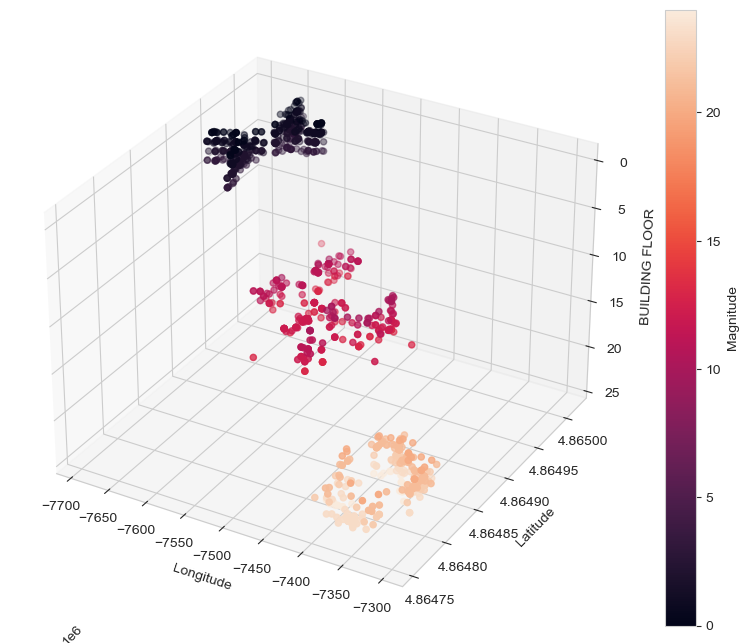

In [152]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
p = ax.scatter(latitude_predicted, longitude_predicted, buildingfloor_predicted, c=buildingfloor_predicted, marker='o')

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_zlabel('BUILDING FLOOR')
ax.invert_zaxis()
cb = fig.colorbar(p,label='Magnitude')

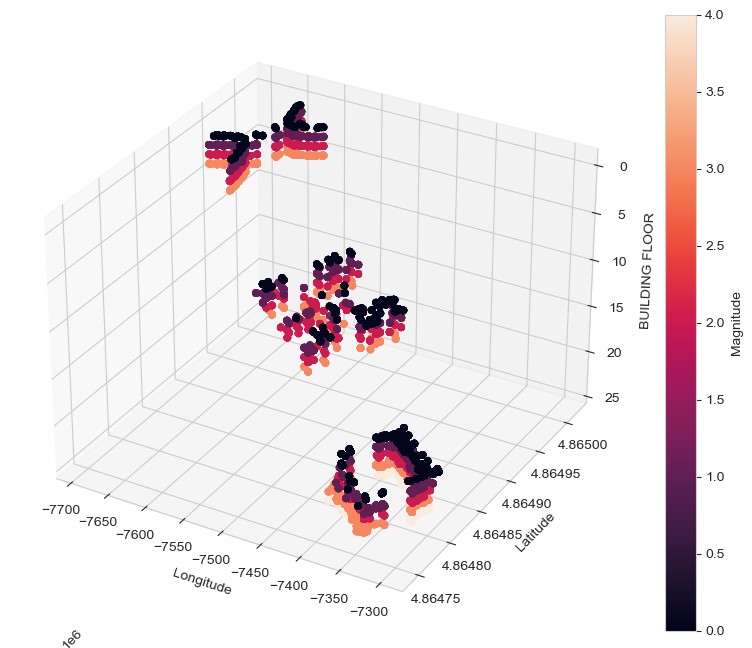

In [153]:
longitude = df['LONGITUDE'].values
latitude = df['LATITUDE'].values
buildingfloor = df['BUILDINGFLOOR'].values
floor = df['FLOOR'].values

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
p = ax.scatter(longitude, latitude, buildingfloor, c=floor, marker='o')

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_zlabel('BUILDING FLOOR')
ax.invert_zaxis()
cb = fig.colorbar(p,label='Magnitude')

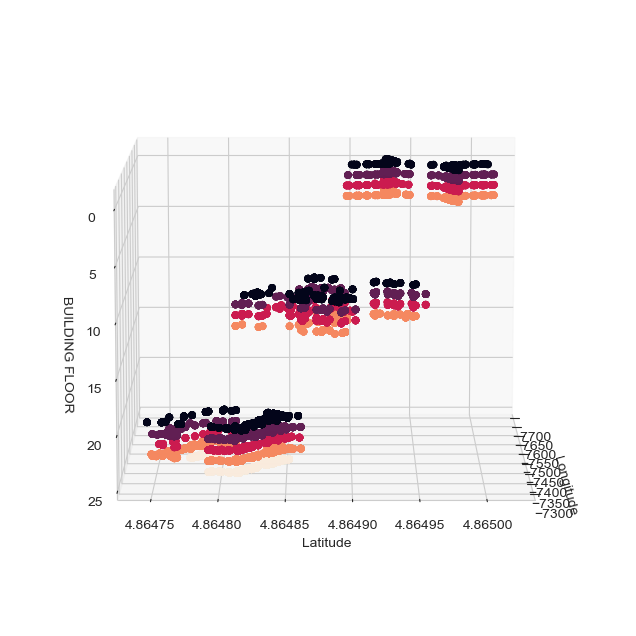

In [155]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation

# Assuming you have already defined the variables 'longitude', 'latitude', 'buildingfloor', and 'floor'

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

def update_plot(frame):
    ax.cla()
    ax.scatter(longitude, latitude, buildingfloor, c=floor, marker='o')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.set_zlabel('BUILDING FLOOR')
    ax.invert_zaxis()
    ax.view_init(elev=10, azim=frame)

ani = FuncAnimation(fig, update_plot, frames=range(0, 360, 5), interval=100)
ani.save('plot_rotation.gif', writer='pillow')

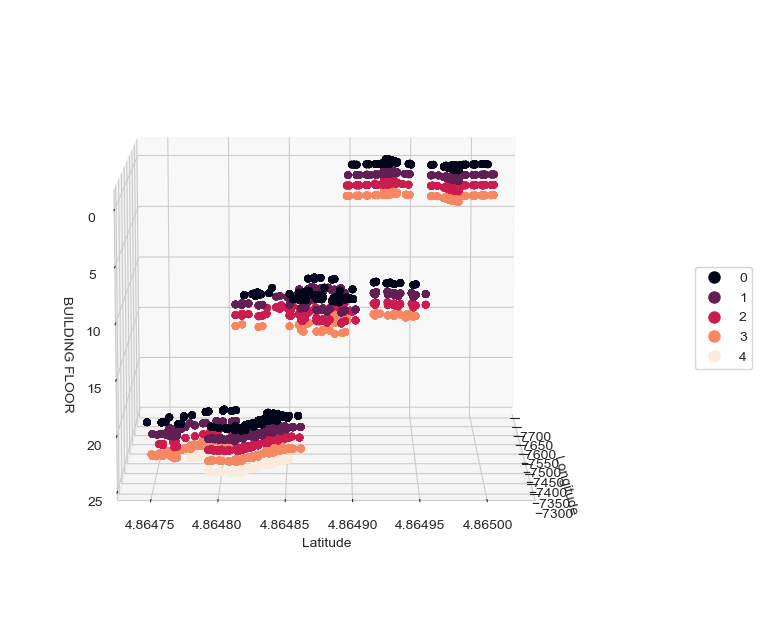

In [157]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation

# Assuming you have already defined the variables 'longitude', 'latitude', 'buildingfloor', and 'floor'

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

def update_plot(frame):
    ax.cla()
    scatter = ax.scatter(longitude, latitude, buildingfloor, c=floor, marker='o')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.set_zlabel('BUILDING FLOOR')
    ax.invert_zaxis()
    ax.view_init(elev=10, azim=frame)
    # Add legend
    legend_labels = sorted(list(set(floor)))
    legend_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=10) for label in legend_labels]
    ax.legend(legend_handles, legend_labels, loc='center left', bbox_to_anchor=(1.1, 0.5))

ani = FuncAnimation(fig, update_plot, frames=range(0, 360, 5), interval=100)
ani.save('plot_rotation.gif', writer='pillow')


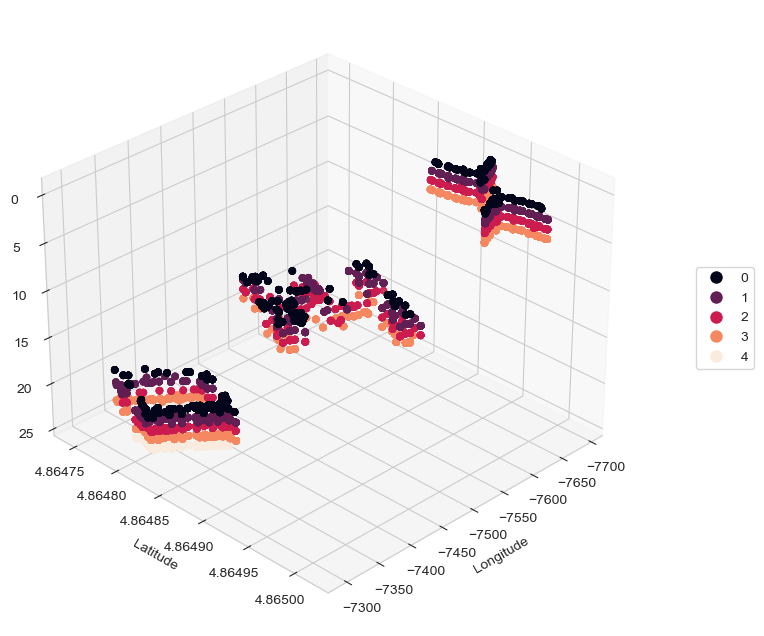

In [158]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation

# Assuming you have already defined the variables 'longitude', 'latitude', 'buildingfloor', and 'floor'

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

def update_plot(frame):
    ax.cla()
    scatter = ax.scatter(longitude, latitude, buildingfloor, c=floor, marker='o')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.set_zlabel('BUILDING FLOOR')
    ax.invert_zaxis()
    ax.view_init(elev=30, azim=45+frame)  # Adjust the elevation and azimuth angles
    # Add legend
    legend_labels = sorted(list(set(floor)))
    legend_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=10) for label in legend_labels]
    ax.legend(legend_handles, legend_labels, loc='center left', bbox_to_anchor=(1.1, 0.5))

ani = FuncAnimation(fig, update_plot, frames=range(0, 360, 5), interval=100)
ani.save('plot_rotation.gif', writer='pillow')


In [ ]:
buildingfloor = df['BUILDINGFLOOR'].values

In [ ]:
buildingfloor

##  **Standard Ensemble Learning Strategies** 

### Cascade modelling

1. MAKE PREDICTIONS WITH THE BEST MODEL, WITH A COHERENT ORDER. FIRST CLASSIFIER AND THEN REGRESSORS. TRY DIFFERENT ORDERS. BUILDING - LATITUDE- LONGITUDE -FLOOR. SO THE FIRSST PREDICTIONS WILL BE THE BEST. PREDICTED VALUES TO PREDICT SECOND VARAIBALES, WE WANT PREDICTOS TO BE A BEST AS WE CAN. ARRASTREM EL MÉS PETIT ERROR. 

In [ ]:
import pandas as pd
cascade = pd.DataFrame()

In [ ]:
from sklearn.ensemble import ExtraTreesClassifier
algo_ExtraTreesClassifier_latitude = ExtraTreesClassifier()
# fit the model on the whole dataset
model_ExtraTreesClassifier_latitude = algo_ExtraTreesClassifier_latitude.fit(independent_lat_train, dependent_lat_train)

In [ ]:
cascade["predictions_latitude"] = model_ExtraTreesClassifier_latitude.predict(independent_lat_train)

POSSIBLE OVERFITTING WARNING!

IF PREDICT VALIDATION DATA, THEN WE HAVE N VALIDATION ROWS WITH PREDICTED LATITUDE, CANNOT USE THESE AS INDEPENDENT VARIABLE. IF  

NOTE: OUR MODEL IS TRAINED WITH 20.000 ROWS OF THE TRAINING DATASET, THEN I'M PREDICTING ON A VALIDATION DATASET. USE THE ENTIRE TRAIN AS OUR CSV_TRAIN. 

our new training will be all waps with latitude predicted. use best model, extra trees longitude. use entire dataset. use entire training and our train, not even have to depend train test split, entire thig to train, to fit, and then add column . then we can also use the four modules to make predictions on the validation csv. and we would predictions. completely unseen data. in this way, its impossible. posssible overfitting of model, but if we use randomforest, robust to overfitting. uses average and control overfitting.  

In [ ]:
independent_long_train

**STEPS**:

# Making Predictions with the Best Model

To achieve the most accurate predictions, we followed a coherent order of prediction using a combination of classifiers and regressors. We experimented with different orders, considering the variables in the following sequence: **Building-Floor**, **Latitude** and **Longitude**, By 

- We started by making predictions for the variable that best predicted the model: **Longitude**. These predicted values were then incorporated into the dataset as an independent variable.
- Next, we performed a train-test split on the dataset, considering **Building-Floor**, **Latitude**, and the **appended Longitude predictions**. We allocated 50% of the samples for testing, resulting in a test dataset containing **50,750 samples**.
- We appended the latitude predictions to the dataset and proceeded to make predictions for **Latitude**.
- Following the same train-test split procedure, this time considering **Building-Floor** and the appended **Longitude and Lonfitude**,

**Best First Model**: Extra Trees Regressor for the **Longitude** variable. We utilized this model to make predictions for Longitude using the test dataset.

Through this approach, we aimed to leverage the predictive accuracy of the models and continually improve the predictions for each subsequent variable based on the already predicted variables.

## Findings and Conclusions

By applying the aforementioned methodology, we were able to make predictions for the variables in a coherent order, considering their dependencies. **By leveraging the initial predictions with the highest accuracy, we improved the overall predictive performance of the model.**

- The use of different models for classification and regression tasks allowed us to optimize the predictions for each variable. 
- We observed that the Extra Trees Regressor performed exceptionally well in predicting the **Longitude** variable.

In conclusion, our approach of iteratively predicting variables based on the best model and incorporating the predicted values into the dataset yielded improved results. This methodology can be applied to similar prediction tasks to enhance the accuracy and reliability of the predictions.

# Applications and Next Steps

## Applications

The developed methodology and predictive models have various applications in the field of indoor localization and mobile sensing. Some potential applications include:

- **Indoor Navigation**: The accurate prediction of building, floor, latitude, and longitude can be leveraged to develop smartphone apps for indoor navigation, helping users navigate complex indoor environments with ease.
- **Location-based Services**: By accurately determining the user's indoor location, location-based services such as personalized recommendations, targeted advertising, and resource allocation can be optimized.
- **Asset Tracking**: The ability to predict the precise indoor location can be utilized for tracking and managing assets within large indoor spaces, such as warehouses, hospitals, or shopping centers.

## Next Steps

While the current project has provided valuable insights and predictive models for indoor localization, there are several potential avenues for further exploration and improvement:

- **Model Refinement**: Fine-tuning and optimizing the existing models can potentially enhance their predictive accuracy and performance.
- **Feature Engineering**: Exploring additional features, such as time-based patterns, environmental conditions, or user behavior, could lead to improved predictions and a more comprehensive understanding of indoor localization.
- **Real-time Implementation**: Adapting the predictive models and algorithms for real-time implementation on mobile devices would enable instant indoor localization and navigation capabilities.

# Usability and Purpos

By following the provided methodology and leveraging the predictive models, users can benefit from improved indoor localization accuracy, leading to enhanced indoor navigation experiences, location-based services, and asset management. The project serves as a foundation for further research and development in the field, driving innovation and practical applications in the domain of indoor localization.
